In [1]:
from mpl_toolkits.mplot3d import Axes3D
from scipy import signal, special
import matplotlib.pyplot as plt
import connectivipy as cp
import scipy.stats as st 
import networkx as nx
import pandas as pd
import numpy as np
import pyedflib
import louvain
import igraph
import copy
import json

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
def save_json(name, data):
    with open(name, "w") as f:
         json.dump(data, f)
    print("done.")

def load_json(name, data=None):
    with open(name, "r") as f:
         data = json.load(f)
    return data

In [4]:
def plot(plt, x, y, name=[""], title="", xlabel="", ylabel="", flag=True, p=False):
    
    plt.plot(x, y, '-')
    if flag:
        plt.title(title, fontsize=24)
        plt.xlabel(xlabel, fontsize=18)
        plt.ylabel(ylabel, fontsize=18)
        plt.legend(name, fontsize=14, loc=7)
        plt.grid()
        if p:
            plt.savefig(name[0], format="pdf")
        plt.show()

def plot_2(x1, y1, x2, y2, title1='', title2='', legend1="", legend2=""):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    plot(ax1, x1, y1, flag=False)
    ax1.set_title(title1, fontsize=30)
    ax1.legend(legend1, fontsize=14, loc=7)
    ax1.grid()
    plot(ax2, x2, y2, flag=False)
    ax2.set_title(title2, fontsize=30)
    ax2.legend(legend2, fontsize=14, loc=7)
    ax2.grid()
    #ax2.set_ylim([0,1])
    #f.show()

In [5]:
def extractSignal(f):
    n = f.signals_in_file
    signal_labels = f.getSignalLabels()
    sigbufs = np.zeros((n, f.getNSamples()[0]))
    for i in np.arange(n):
        sigbufs[i, :] = f.readSignal(i)
    return sigbufs

In [6]:
locations=pd.read_csv("./data/channel_locations.txt", sep="\t")
x=locations.x.values
y=locations.y.values
position=list(zip(x,y))

EO  (Eyes-open rest state)

In [7]:
EO=pyedflib.EdfReader("data/S050R01.edf")

EC  (Eyes-closed rest state)

In [8]:
EC=pyedflib.EdfReader("data/S050R02.edf")

[10-20 system] ( https://en.wikipedia.org/wiki/10%E2%80%9320_system_(EEG) )

In [9]:
signal_labels = EO.getSignalLabels()

In [10]:
def signal_routine(EO, EC):
    signal_EO=extractSignal(EO)
    signal_EC=extractSignal(EC)
    n, m = signal_EO.shape
    signals=np.zeros((n, m, 2))
    signals[:,:,0] = signal_EO[:]
    signals[:,:,1] = signal_EC[:]
    
    logic1=(signals[:,:,0] == signal_EO).mean()
    logic2=(signals[:,:,1] == signal_EC).mean()
    return signals

In [11]:
signals=signal_routine(EO, EC)

In [12]:
for i in range(len(signals)):
    eo=signals[i,:,0]
    ec=signals[i,:,1]
    print(i, signal_labels[i], "EO: " + str(np.mean(eo)), "EC: " + str(np.mean(ec)))

0 Fc5. EO: 0.0517418032787 EC: 1.46239754098
1 Fc3. EO: 1.07551229508 EC: 1.6681352459
2 Fc1. EO: 1.10512295082 EC: 1.38524590164
3 Fcz. EO: 1.3056352459 EC: 1.40245901639
4 Fc2. EO: 0.569672131148 EC: 0.474590163934
5 Fc4. EO: 1.33985655738 EC: 1.56895491803
6 Fc6. EO: 1.17336065574 EC: 0.410348360656
7 C5.. EO: 1.16055327869 EC: 1.72899590164
8 C3.. EO: 1.11977459016 EC: 0.945594262295
9 C1.. EO: 1.77920081967 EC: 1.98268442623
10 Cz.. EO: 2.70297131148 EC: 2.9637295082
11 C2.. EO: 4.16711065574 EC: 1.26331967213
12 C4.. EO: 1.1318647541 EC: 0.286270491803
13 C6.. EO: 1.50327868852 EC: 0.185348360656
14 Cp5. EO: 3.46823770492 EC: 3.58442622951
15 Cp3. EO: 2.92827868852 EC: 2.67571721311
16 Cp1. EO: 2.28114754098 EC: 2.50348360656
17 Cpz. EO: 2.26383196721 EC: 2.81034836066
18 Cp2. EO: 2.80676229508 EC: 2.51403688525
19 Cp4. EO: 2.26444672131 EC: 1.46793032787
20 Cp6. EO: 3.37694672131 EC: 2.04405737705
21 Fp1. EO: -27.8198770492 EC: 1.09067622951
22 Fpz. EO: -26.2074795082 EC: -3.382

In [13]:
n = EO.getNSamples()[0]

In [14]:
samples=[i for i in range(n)]

In [15]:
t=np.random.randint(0,len(signal_labels))

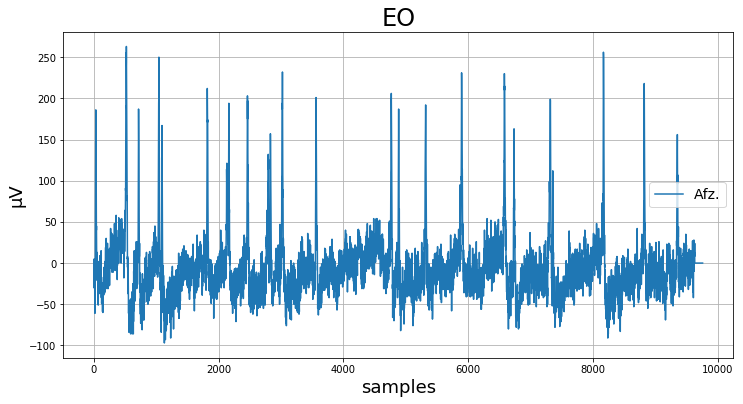

In [21]:
plt.figure(figsize=(12,6))
plot(plt, samples, signals[t,:,0], title="EO", name=[signal_labels[t]], xlabel="samples", ylabel="µV", p=True)

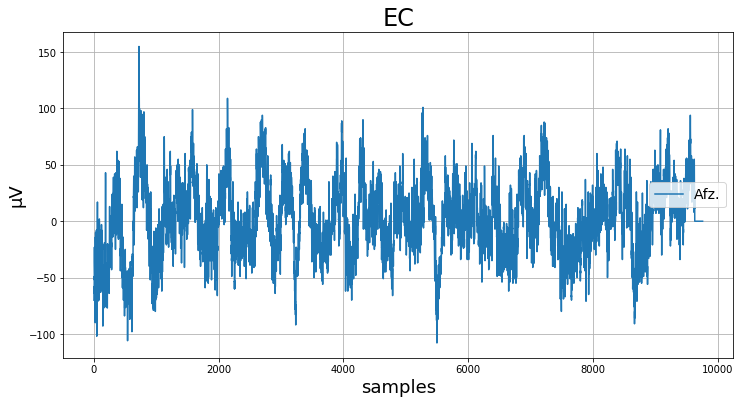

In [22]:
plt.figure(figsize=(12,6))
plot(plt, samples, signals[t,:,1], title="EC", name=[signal_labels[t]], xlabel="samples", ylabel="µV", p=True)

In [ ]:
t=np.random.randint(0,len(signal_labels))
plot_2(samples, signals[t,:,0], samples, signals[t,:,1], title1='EO', legend1=signal_labels[t], title2='EC', legend2=signal_labels[t])
plt.show()

### 1.1) Select relevant channel and estimate Power Spectral Density (PSD) using one of the methods introduced during the course. Justify your choice of channel selection and parameters  used for PSD estimation.

In [23]:
fs = EO.samplefrequency(1)
n=EO.getNSamples()[0]
T=60

In [24]:
n//T

162

In [25]:
fs

160.0

In [26]:
def plot_psd(psd_w, f_w, name="", flag=False):
    plt.figure(figsize=(20,10))
    n_signals=len(psd_w)
    for i in range(n_signals):
        # plt.semilogy
        plt.plot(f_w, psd_w[i,:])
    plt.xlabel('Frequency [Hz]', fontsize=18)
    plt.ylabel('Spectrum [µV**2/Hz]', fontsize=18)
    plt.xlim(0,20)
    plt.ylim(0,2000)
    plt.legend(signal_labels, fontsize=14, ncol=4)
    plt.grid()
    if flag:
        plt.savefig(name, format='pdf')
    plt.show()

In [27]:
def channel_activity(psd):
    psd_copy=psd.copy()
    res=[]
    n=psd_copy.shape[0]
    for _ in range(n):
        ix=np.argmax(np.mean(psd_copy, axis=1))
        #ix2=np.argmax(np.max(psd_w_copy, axis=1))
        res.append(ix)
        psd_copy[ix] = 0
    return res

In [28]:
def frequency_max_magnitude(psd, f, t):
    res=f[np.argmax(psd[t:]) + t]
    return res

In [29]:
def print_activity(psd, f, res, t=0):
    for i in res:
        print(signal_labels[i] + " --> ", end="")
        x = frequency_max_magnitude(psd[i,:], f, t)
        print( str(x) + " | ", end="")

### welch method EO

In [30]:
f_w_eo, psd_w_eo = signal.welch(signals[:,:,0], fs,  nfft=2000, nperseg=256, noverlap=256//2, scaling="density", axis=1)

In [31]:
fs

160.0

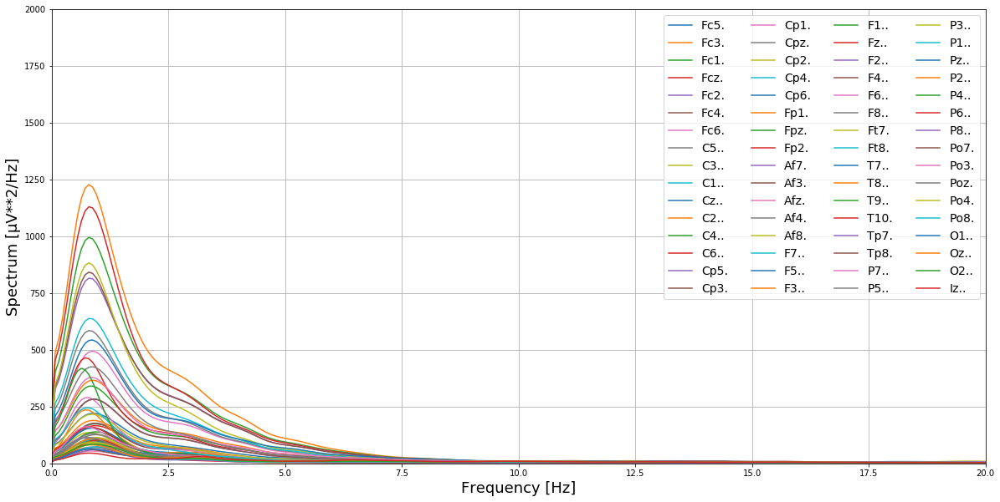

In [32]:
plot_psd(psd_w_eo, f_w_eo, "psd_all_eo", True)

### welch method EC

In [33]:
f_w_ec, psd_w_ec = signal.welch(signals[:,:,1], fs, nfft=2000, nperseg=256, noverlap=256//2, scaling="density", axis=1)

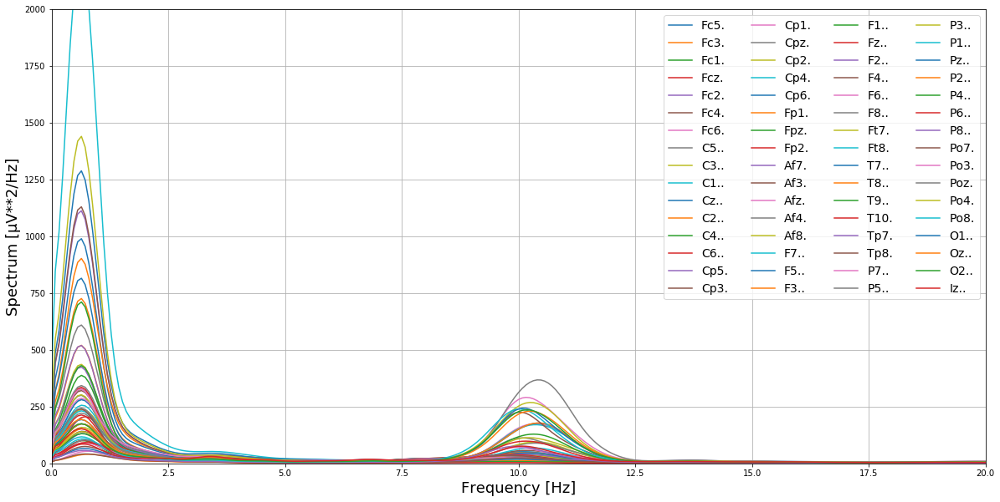

In [34]:
plot_psd(psd_w_ec, f_w_ec, "psd_all_ec", True)

In [ ]:
plt.figure(figsize=(20,10))
n_signals=len(psd_w_eo)
for i in range(n_signals):
    # plt.semilogy
    plt.semilogy(f_w_eo, psd_w_eo[i,:], "blue")
    plt.semilogy(f_w_ec, psd_w_ec[i,:], "green")
plt.xlabel('Frequency [Hz]', fontsize=18)
plt.ylabel('Spectrum [µV**2/Hz]', fontsize=18)
plt.xlim(0,20)
plt.legend(["EO", "EC"], fontsize=14, ncol=4)
plt.grid()
plt.savefig("psd_all_comparison", format="pdf")
plt.show()

## sort in order of activity

In [35]:
psd_w_eo.shape

(64, 1001)

In [36]:
res_w_eo=channel_activity(psd_w_eo)

print_activity(psd_w_eo, f_w_eo, res_w_eo)

Fp1. --> 0.8 | Fp2. --> 0.8 | Fpz. --> 0.8 | Af8. --> 0.8 | Af3. --> 0.8 | Af7. --> 0.8 | F5.. --> 0.88 | F7.. --> 0.8 | Af4. --> 0.8 | Afz. --> 0.88 | F6.. --> 0.88 | F8.. --> 0.88 | F3.. --> 0.88 | Fz.. --> 0.72 | F1.. --> 0.88 | F2.. --> 0.88 | F4.. --> 0.88 | Fc5. --> 0.88 | Ft7. --> 0.88 | Fc6. --> 0.8 | Fc3. --> 0.88 | T9.. --> 0.64 | Fc2. --> 0.96 | Fc1. --> 0.96 | Ft8. --> 0.8 | C2.. --> 0.72 | Fcz. --> 0.96 | Fc4. --> 0.96 | C1.. --> 0.88 | Po3. --> 0.72 | Cz.. --> 0.88 | C5.. --> 0.96 | Cpz. --> 0.88 | C3.. --> 0.8 | Poz. --> 0.8 | C4.. --> 0.96 | C6.. --> 0.8 | Oz.. --> 0.88 | Cp1. --> 0.88 | Cp2. --> 0.96 | P1.. --> 0.96 | Cp3. --> 0.88 | P2.. --> 0.96 | Pz.. --> 0.96 | Tp7. --> 0.72 | T7.. --> 0.88 | P3.. --> 0.88 | Po7. --> 0.8 | O2.. --> 0.96 | Cp4. --> 0.96 | O1.. --> 0.8 | Po4. --> 0.88 | Iz.. --> 0.8 | Cp5. --> 0.88 | P4.. --> 0.96 | P5.. --> 0.88 | P7.. --> 0.88 | Po8. --> 0.96 | P6.. --> 0.96 | Cp6. --> 0.96 | T8.. --> 0.96 | Tp8. --> 1.04 | P8.. --> 0.96 | T10. -->

In [37]:
res_w_ec=channel_activity(psd_w_ec)

print_activity(psd_w_ec, f_w_ec, res_w_ec)

F7.. --> 0.64 | Ft7. --> 0.64 | F5.. --> 0.64 | Af3. --> 0.64 | Af7. --> 0.64 | Fc5. --> 0.64 | Fp1. --> 0.64 | Poz. --> 10.4 | Po3. --> 10.16 | T7.. --> 0.64 | F3.. --> 0.64 | C5.. --> 0.64 | Oz.. --> 10.24 | O1.. --> 10.08 | Po7. --> 0.64 | Po4. --> 10.24 | Fc3. --> 0.64 | T9.. --> 0.64 | O2.. --> 10.16 | Cp1. --> 0.64 | P1.. --> 0.64 | Tp7. --> 0.64 | Po8. --> 10.0 | P3.. --> 0.64 | P2.. --> 10.4 | Pz.. --> 10.4 | F1.. --> 0.64 | C3.. --> 0.64 | P5.. --> 0.64 | Cp5. --> 0.64 | Cpz. --> 0.64 | Cp3. --> 0.64 | P7.. --> 0.64 | Fpz. --> 0.64 | C1.. --> 0.64 | Cz.. --> 0.64 | Fz.. --> 0.64 | Fc1. --> 0.64 | Afz. --> 0.64 | Iz.. --> 0.64 | P4.. --> 0.64 | Cp2. --> 0.64 | Fcz. --> 0.64 | F8.. --> 0.64 | Fp2. --> 0.72 | Af8. --> 0.64 | C2.. --> 0.64 | Fc2. --> 0.64 | P6.. --> 10.16 | Cp4. --> 0.64 | F2.. --> 0.64 | Ft8. --> 0.64 | F4.. --> 0.64 | C4.. --> 0.64 | Af4. --> 0.72 | P8.. --> 9.92 | Fc4. --> 0.72 | Cp6. --> 0.72 | F6.. --> 0.72 | C6.. --> 0.72 | Fc6. --> 0.8 | Tp8. --> 0.72 | T10

In [38]:
channel_eo=res_w_eo[0]

## sort in order of activity (excluding the low frequency because always active)

In [39]:
f_ix = np.where(f_w_eo>7)[0][0]

In [40]:
res_w_eo=channel_activity(psd_w_eo[:,f_ix:])

print_activity(psd_w_eo, f_w_eo, res_w_eo, t=f_ix)

F5.. --> 7.04 | Af8. --> 7.04 | F6.. --> 7.04 | Fp1. --> 7.04 | F7.. --> 7.04 | Fp2. --> 7.04 | F3.. --> 7.04 | Af4. --> 7.04 | F8.. --> 7.04 | Af3. --> 7.04 | Af7. --> 7.04 | Fc3. --> 60.0 | Cpz. --> 60.0 | Oz.. --> 60.0 | C5.. --> 60.0 | Fpz. --> 7.04 | Ft7. --> 7.04 | Iz.. --> 7.04 | F1.. --> 7.04 | Poz. --> 11.12 | Po7. --> 13.36 | Fc5. --> 7.04 | Fc2. --> 60.0 | Afz. --> 7.04 | Po3. --> 11.2 | Fz.. --> 7.04 | O1.. --> 7.04 | F2.. --> 7.04 | F4.. --> 7.04 | Cp1. --> 11.2 | Fc1. --> 7.04 | O2.. --> 7.04 | P1.. --> 11.2 | Fcz. --> 7.04 | C1.. --> 12.56 | Tp7. --> 60.0 | P7.. --> 13.36 | Cz.. --> 12.56 | Cp3. --> 60.0 | P2.. --> 12.4 | Pz.. --> 12.48 | Fc4. --> 7.04 | P5.. --> 11.28 | C2.. --> 13.92 | Po8. --> 12.4 | Fc6. --> 60.0 | P3.. --> 11.2 | C3.. --> 7.04 | Cp2. --> 12.48 | Po4. --> 12.4 | Cp5. --> 11.2 | T7.. --> 11.36 | P4.. --> 12.4 | C4.. --> 13.92 | Cp4. --> 12.48 | T9.. --> 7.44 | P6.. --> 11.04 | Cp6. --> 60.0 | C6.. --> 7.04 | P8.. --> 11.12 | Ft8. --> 7.04 | Tp8. --> 6

In [41]:
res_w_ec=channel_activity(psd_w_ec[:,f_ix:])

print_activity(psd_w_ec, f_w_ec, res_w_ec, t=f_ix)

Poz. --> 10.4 | Po3. --> 10.16 | Po4. --> 10.24 | Oz.. --> 10.24 | O1.. --> 10.08 | O2.. --> 10.16 | Po8. --> 10.0 | Po7. --> 10.0 | Cp1. --> 10.4 | P1.. --> 10.4 | P2.. --> 10.4 | Pz.. --> 10.4 | Cpz. --> 10.4 | P4.. --> 10.32 | P3.. --> 10.24 | P5.. --> 10.08 | Iz.. --> 10.08 | Cp2. --> 10.4 | P6.. --> 10.16 | Cp3. --> 10.16 | P7.. --> 10.0 | C1.. --> 10.08 | Cz.. --> 10.08 | Cp4. --> 10.32 | Fc3. --> 60.0 | C5.. --> 60.0 | C2.. --> 10.16 | Fc2. --> 10.0 | P8.. --> 9.92 | Fcz. --> 9.92 | Fc1. --> 9.92 | C3.. --> 10.08 | F1.. --> 9.84 | Cp5. --> 10.08 | Fz.. --> 9.84 | C4.. --> 10.16 | F2.. --> 9.84 | Afz. --> 9.84 | Fp1. --> 9.76 | F3.. --> 9.84 | Af3. --> 9.84 | F4.. --> 9.84 | F5.. --> 9.92 | Af7. --> 9.84 | Fc4. --> 9.92 | Cp6. --> 10.24 | Tp7. --> 10.0 | Fc5. --> 9.92 | Fp2. --> 9.76 | Fpz. --> 9.76 | Af4. --> 9.76 | F7.. --> 9.84 | Af8. --> 9.76 | Ft7. --> 9.92 | T7.. --> 9.92 | F6.. --> 9.76 | Fc6. --> 9.84 | C6.. --> 10.0 | Tp8. --> 10.0 | F8.. --> 9.76 | T9.. --> 9.76 | Ft8. 

In [42]:
channel_ec=res_w_ec[0]

In [43]:
channels=[channel_eo, channel_ec]

In [44]:
for i in channels:
    print(signal_labels[i])

Fp1.
Poz.


###  1.2)  Compare two different methods of PSD estimation

### compare  EO/EC

In [82]:
f_w_eo, psd_w_eo = signal.welch(signals[channels,:,0], fs, nfft=2000, nperseg=256, noverlap=256//2, scaling="density", axis=1)
f_w_ec, psd_w_ec = signal.welch(signals[channels,:,1], fs, nfft=2000, nperseg=256, noverlap=256//2, scaling="density", axis=1)

In [46]:
f_p_eo, psd_p_eo = signal.periodogram(signals[channels,:,0], fs, nfft=9000, scaling="density", axis=1)
f_p_ec, psd_p_ec = signal.periodogram(signals[channels,:,1], fs, nfft=9000, scaling="density", axis=1)

In [47]:
c1, c2 = (signal_labels[channels[0]], signal_labels[channels[1]])

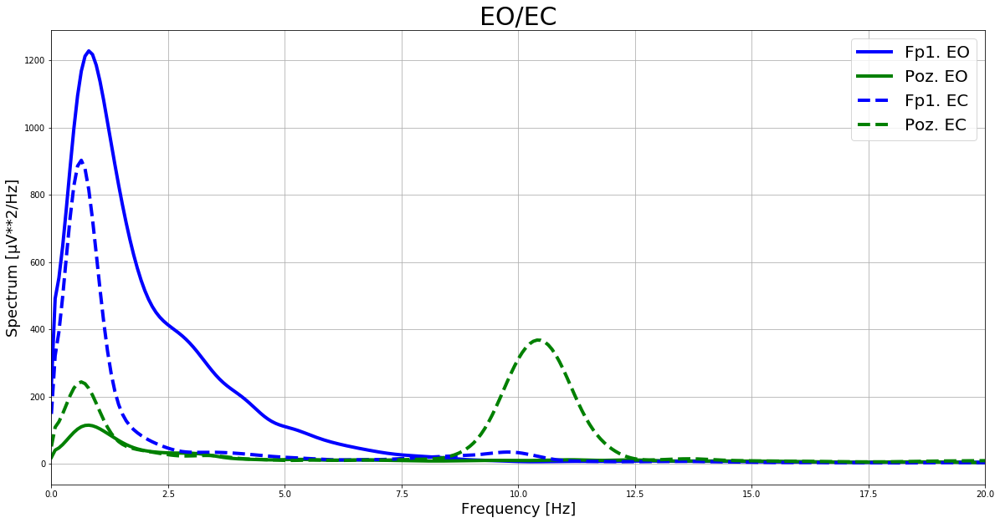

In [83]:
plt.figure(figsize=(20,10))
plt.plot(f_w_eo, psd_w_eo[0,:], color="blue", linewidth=4.0 )
plt.plot(f_w_eo, psd_w_eo[1,:], color="green", linewidth=4.0)
plt.plot(f_w_ec, psd_w_ec[0,:], "r--", color="blue", linewidth=4.0 )
plt.plot(f_w_ec, psd_w_ec[1,:], "r--", color="green", linewidth=4.0)

plt.xlabel('Frequency [Hz]', fontsize=18)
plt.ylabel('Spectrum [µV**2/Hz]', fontsize=18)
plt.xlim(0,20)
plt.title("EO/EC", fontsize=30)
plt.legend([c1 + " EO", c2 + " EO", c1 + " EC", c2 + " EC" ], fontsize=20, ncol=1)
plt.grid()
#plt.savefig("psd_w_eo_ec", format="pdf")
plt.show()

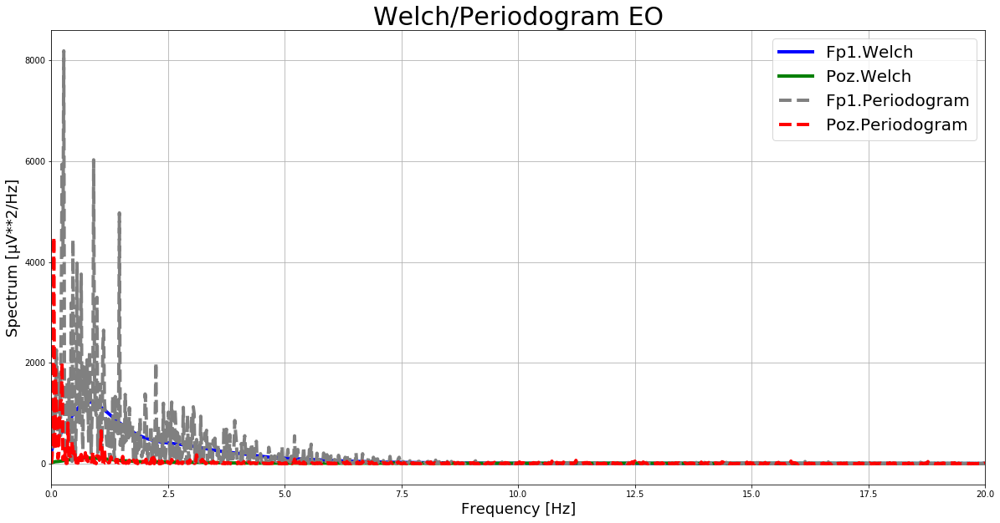

In [56]:
plt.figure(figsize=(20,10))

plt.plot(f_w_eo, psd_w_eo[0,:], color="blue", linewidth=4.0 )
plt.plot(f_w_eo, psd_w_eo[1,:], color="green", linewidth=4.0)
plt.plot(f_p_eo, psd_p_eo[0,:], "r--", color="grey", linewidth=4.0 )
plt.plot(f_p_eo, psd_p_eo[1,:], "r--", color="red", linewidth=4.0)

plt.xlabel('Frequency [Hz]', fontsize=18)
plt.ylabel('Spectrum [µV**2/Hz]', fontsize=18)
plt.xlim(0,20)
#plt.ylim(0,2000)
plt.title("Welch/Periodogram EO", fontsize=30)
plt.legend([ c1 + "Welch", c2 + "Welch", c1 + "Periodogram", c2 + "Periodogram" ], fontsize=20, ncol=1)
plt.grid()
plt.savefig("psd_wp_eo", format="pdf")
plt.show()

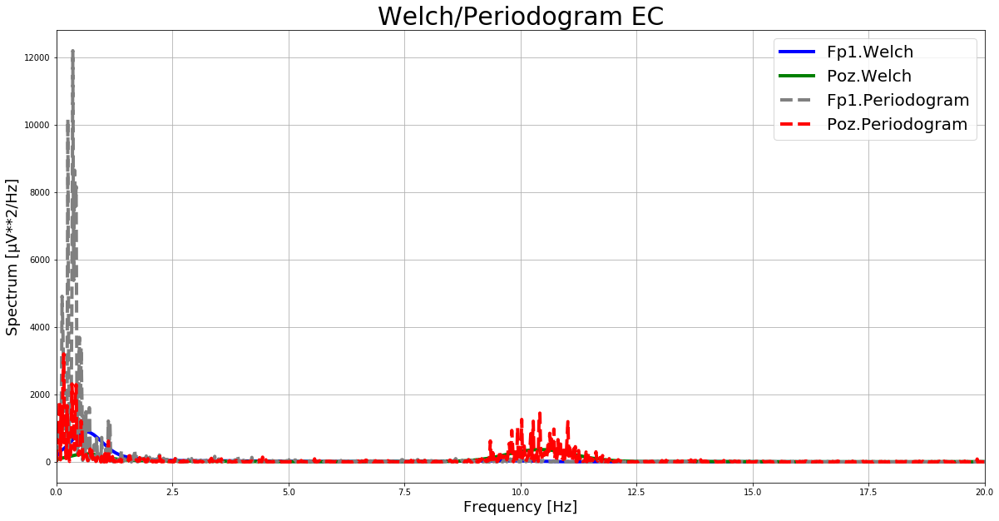

In [57]:
plt.figure(figsize=(20,10))

plt.plot(f_w_ec, psd_w_ec[0,:], color="blue", linewidth=4.0 )
plt.plot(f_w_ec, psd_w_ec[1,:], color="green", linewidth=4.0)
plt.plot(f_p_eo, psd_p_ec[0,:], "r--", color="grey", linewidth=4.0 )
plt.plot(f_p_eo, psd_p_ec[1,:], "r--", color="red", linewidth=4.0)

plt.xlabel('Frequency [Hz]', fontsize=18)
plt.ylabel('Spectrum [µV**2/Hz]', fontsize=18)
plt.xlim(0,20)
#plt.ylim(0,2000)
plt.title("Welch/Periodogram EC", fontsize=30)
plt.legend([ c1 + "Welch", c2 + "Welch", c1 + "Periodogram", c2 + "Periodogram" ], fontsize=20, ncol=1)
plt.grid()
plt.savefig("psd_wp_ec", format="pdf")
plt.show()

### 1.3) Compare different choices of estimation parameters

In [99]:
n_fft=[256, 512, 1024]
overlap=[int(i*256) for i in np.arange(0, 1.0, 0.25)]

In [100]:
psd_parameters={o:{f:[] for f in n_fft} for o in overlap}

In [101]:
for o in overlap:
    for f in n_fft:
        print(o, f)
        f_w_eo, psd_w_eo = signal.welch(signals[channels,:,0], fs, nfft=f, nperseg=256, noverlap=o, scaling="density", axis=1)
        f_w_ec, psd_w_ec = signal.welch(signals[channels,:,1], fs, nfft=f, nperseg=256, noverlap=o, scaling="density", axis=1)
        psd_parameters[o][f] = [f_w_eo, psd_w_eo, f_w_ec, psd_w_ec]

0 256
0 512
0 1024
64 256
64 512
64 1024
128 256
128 512
128 1024
192 256
192 512
192 1024


In [102]:
psd_parameters.keys()

dict_keys([0, 64, 128, 192])

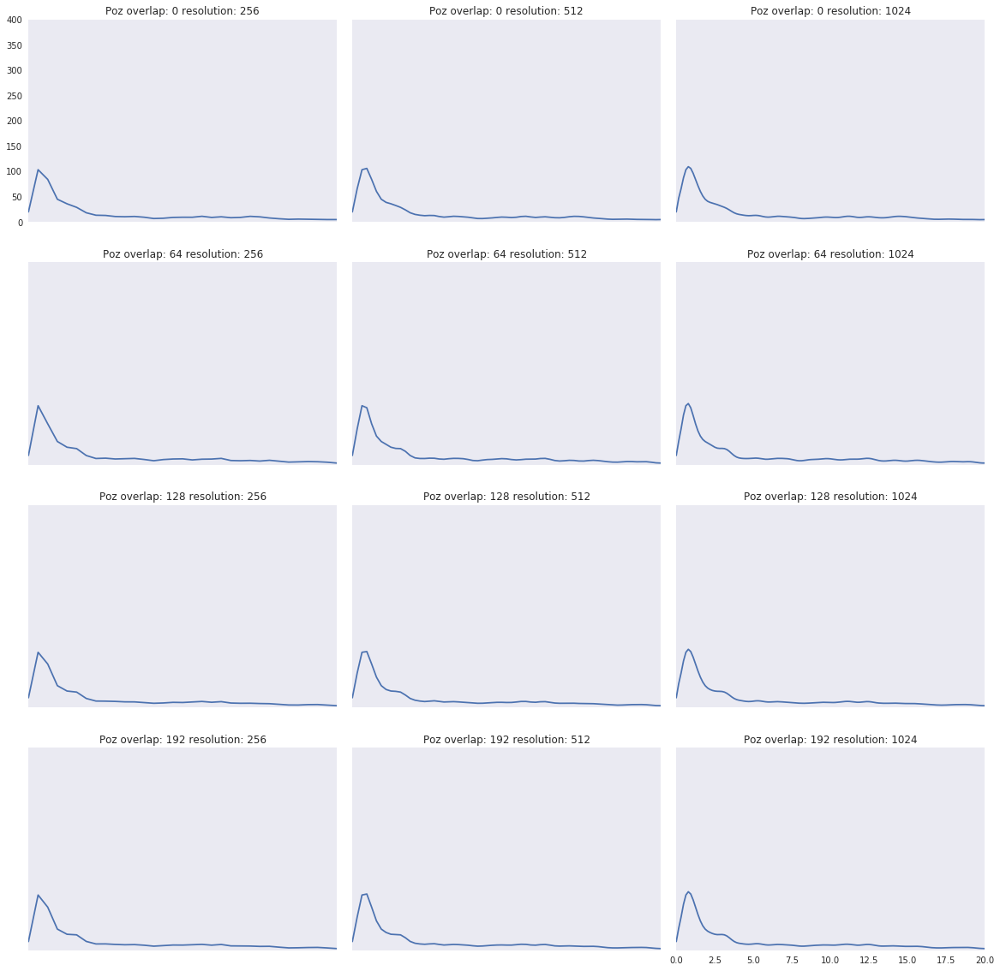

In [164]:
fig, axs = plt.subplots(len(overlap), len(n_fft), figsize=(20,20))
fig.subplots_adjust(hspace = .2, wspace=.05)
plt.setp([a.get_xticklabels() for a in fig.axes[:-1]], visible=False)
plt.setp([a.get_yticklabels() for a in fig.axes[1:]], visible=False)
for o in range(len(overlap)):
    for f in range(len(n_fft)):
            over=overlap[o]
            n_f=n_fft[f]
            ff = psd_parameters[over][n_f][0]
            psd = psd_parameters[over][n_f][1][1]
            axs[o, f].plot(ff, psd)
            axs[o,f].set_ylim(0,400)
            axs[o,f].set_xlim(0,20)
            axs[o,f].set_title("Poz " + "overlap: "+str(over)+ " resolution: "+str(n_f))
plt.savefig("psd_parameters_EO", format="pdf")
plt.show()

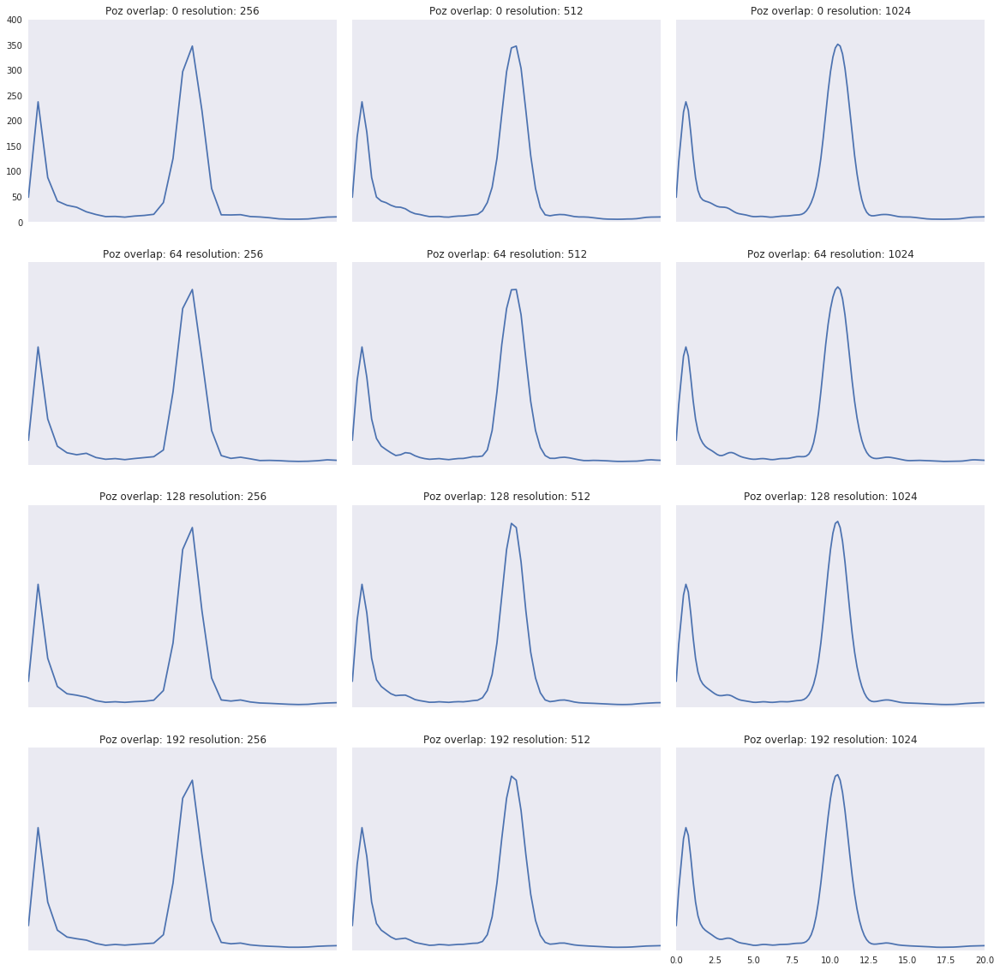

In [163]:
fig, axs = plt.subplots(len(overlap), len(n_fft), figsize=(20,20))
fig.subplots_adjust(hspace = .2, wspace=.05)
plt.setp([a.get_xticklabels() for a in fig.axes[:-1]], visible=False)
plt.setp([a.get_yticklabels() for a in fig.axes[1:]], visible=False)
for o in range(len(overlap)):
    for f in range(len(n_fft)):
            over=overlap[o]
            n_f=n_fft[f]
            ff = psd_parameters[over][n_f][2]
            psd = psd_parameters[over][n_f][3][1]
            axs[o, f].plot(ff, psd)
            axs[o,f].set_xlim(0,20)
            axs[o,f].set_ylim(0,400)
            axs[o,f].set_title("Poz "+"overlap: "+str(over)+ " resolution: "+str(n_f))
plt.savefig("psd_parameters_EC", format="pdf")
plt.show()

### 1.4) Make a multivariate comparison of PSDs, considering simultaneously two independent variables (channels resting state)

In [166]:
f_w_eo, psd_w_eo = signal.welch(signals[:,:,0], fs, nfft=2000, nperseg=256, axis=1)
f_w_ec, psd_w_ec = signal.welch(signals[:,:,1], fs, nfft=2000, nperseg=256, axis=1)

In [167]:
xs=np.linspace(0,64,64)
X = np.array([xs for i in range(2)])

In [168]:
ys=[0,1]
Y =  np.array([ys for i in range(64)])

In [169]:
f_ix=np.argwhere(f_w_ec > 10)[0][0]

In [170]:
Z = np.vstack([psd_w_eo[:,f_ix],psd_w_ec[:,f_ix]])

In [171]:
X.shape

(2, 64)

In [172]:
Z.shape

(2, 64)

In [173]:
f_w_ec[f_ix]

10.08

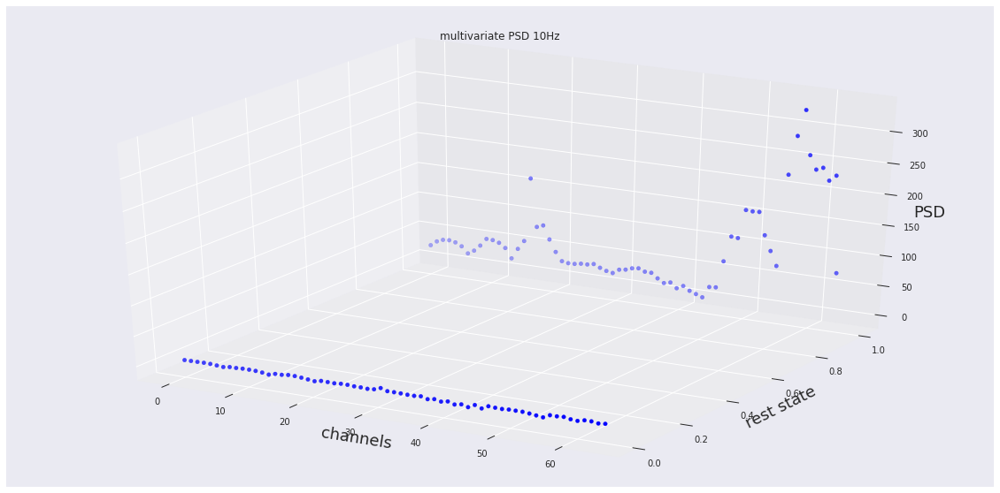

In [175]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X, Y.T, Z, c="blue")
ax.set_xlabel("channels", fontsize=18)
ax.set_ylabel("rest state", fontsize=18)
ax.set_zlabel("PSD", fontsize=18)
ax.set_title("multivariate PSD 10Hz")
fig.savefig("psd_channel_state_10Hz", format="pdf")
plt.show()

### 1.5) Assign a statistical significance value to the differences in PSDs between the two rest conditions.

In [114]:
psd_w_ec.shape

(64, 1001)

In [115]:
f_w_ec.shape

(1001,)

### first approach

In [116]:
error_sample= psd_w_ec[0,:] - psd_w_eo[0,:]

In [119]:
import seaborn as sbs

In [118]:
m=np.mean(error_sample)

In [120]:
s= np.std(error_sample) // np.sqrt(len(error_sample))

In [121]:
x_l, x_r = st.norm.ppf([.025, .975], m, s)

In [122]:
x_l, x_r

(2.5911911238370182, 10.431047061997235)

In [123]:
x_n = np.linspace(-4*s+m, m+4*s, 1000)

In [124]:
f_n=st.norm.pdf(x_n, m, s)

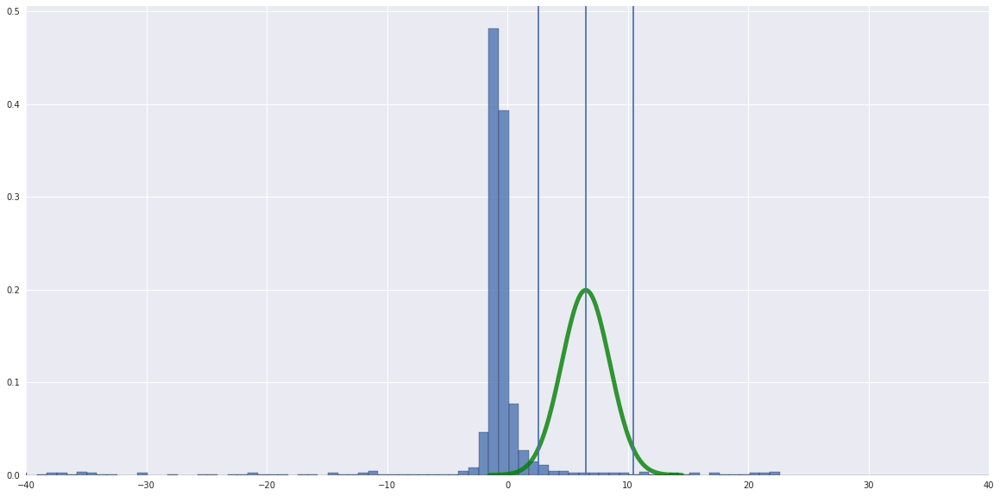

In [132]:
sbs.set()
sbs.set_style({'axes.grid' : False})
plt.figure(figsize=(20,10))
plt.hist(error_sample, normed=True, bins=1000, edgecolor="black", alpha=0.8)
plt.plot(x_n, f_n, color="green", lw=5, alpha=0.8)
plt.axvline(x=x_l)
plt.axvline(x=m)
plt.axvline(x=x_r)
plt.xlim([-40,40])
plt.grid()
plt.savefig("asymptotic.pdf", format="pdf")
plt.show()

In [127]:
p = len(error_sample[error_sample > x_r]) / len(error_sample) + len(error_sample[error_sample < x_l]) / len(error_sample)

In [128]:
p < 0.05

False

In [129]:
p

0.97002997002997

reject the null hypothesis (normal error) with false negative error at 95% confidence of

In [130]:
false_negative=1-p

In [131]:
print(str(false_negative*100) + " %")

2.9970029970029954 %


### second approach

In [133]:
st.mannwhitneyu(psd_w_ec[0,:], psd_w_eo[0,:], alternative="two-sided")

MannwhitneyuResult(statistic=358851.0, pvalue=4.195458594586541e-28)

# connectivity

### 2.1) Estimate functional brain connectivity among 64 channels using one of the MVAR estimators: Partial Directed Coherence (PDC), Direct Transfer Function (DTF). Select one relevant frequency value. Apply a threshold so that the resulting binary connectivity matrices have network density equal to 20%. Create a graphical representation of the binary adjacency matrix


### 2.2) Perform task 2.1 using both estimators (PDC and DTF)

In [134]:
def create_grid(fs):
    ff=np.linspace(0,fs,int(fs))
    xs=np.linspace(0,64,64)
    X = np.array([xs for i in range(64)])
    Y = X.T
    return ff, X, Y

In [177]:
ff, X, Y = create_grid(fs)

### fit on data multivariate auto-regressive model k order

In [178]:
def AR_model(signals):
    data = cp.Data(signals, fs=fs, chan_names=signal_labels, data_info='sml')
    mv = cp.Mvar
    best, crit = mv.order_akaike(signals, 20, 'yw')
    return best, crit, data

In [179]:
def AR_fit(data, best, flag="dtf"):
    data.fit_mvar(best, 'yw')
    ar, vr = data.mvar_coefficients
    
    if flag == "dtf":
        dtf = cp.conn.DTF()
        dtf_matrices = dtf.calculate(Acoef=ar, Vcoef=vr, fs=fs, resolution=fs)
        return dtf_matrices, dtf
    else:
        pdc = cp.conn.PDC()
        pdc_matrices = pdc.calculate(ar, vr, fs)
        return pdc_matrices, pdc

In [180]:
fs=EO.samplefrequency(0)

In [181]:
best_eo, crit_eo, data_eo = AR_model(signals[:,:,0])
best_ec, crit_ec, data_ec = AR_model(signals[:,:,1])

In [140]:
best_eo

8

In [141]:
best_ec

5

In [142]:
max(crit_ec)

1144504.1829826361

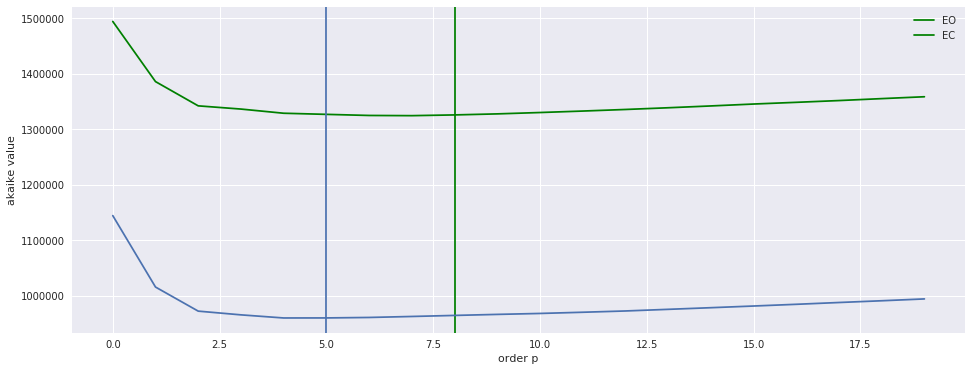

In [143]:
plt.figure(figsize=(16, 6))
plt.plot(crit_eo, color="green")
plt.axvline(x=best_eo, color="green",  ymax=max(crit_eo))
plt.plot(crit_ec)
plt.axvline(x=best_ec, ymax=max(crit_ec))
plt.grid()
plt.ylabel("akaike value")
plt.xlabel("order p")
plt.legend(["EO", "EC"])
plt.savefig("order_AR", format="pdf")
plt.show()

### compute the Direct Transfer Function (DTF)

In [182]:
dtf_matrices_eo, _ = AR_fit(data_eo, best_eo, flag="dtf")
dtf_matrices_ec, _ = AR_fit(data_ec, best_ec, flag="dtf")

In [183]:
ix=np.where((ff>10))[0][0]

In [184]:
Z_dtf_eo = dtf_matrices_eo[ix]
Z_dtf_ec = dtf_matrices_ec[ix]

### compute the Partial Directed Coherence (PDC)

In [185]:
pdc_matrices_eo, _ = AR_fit(data_eo, best_eo, flag="pdc")
pdc_matrices_ec, _ = AR_fit(data_ec, best_ec, flag="pdc")

In [186]:
Z_pdc_eo = pdc_matrices_eo[ix]
Z_pdc_ec = pdc_matrices_ec[ix]

In [187]:
def plot_3D(X, Y, Z, labelx="", labely="", labelz="", name="", flag=False):
    fig = plt.figure(figsize=(20,10))
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(X, Y, Z)
    ax.set_xlabel(labelx, fontsize=18)
    ax.set_ylabel(labely, fontsize=18)
    ax.set_zlabel(labelz, fontsize=18)
    ax.set_title(name, fontsize=20)
    if flag:
        plt.savefig(name, format="pdf")
    plt.show()

### DTF between all channels | fixed frequency using DTF

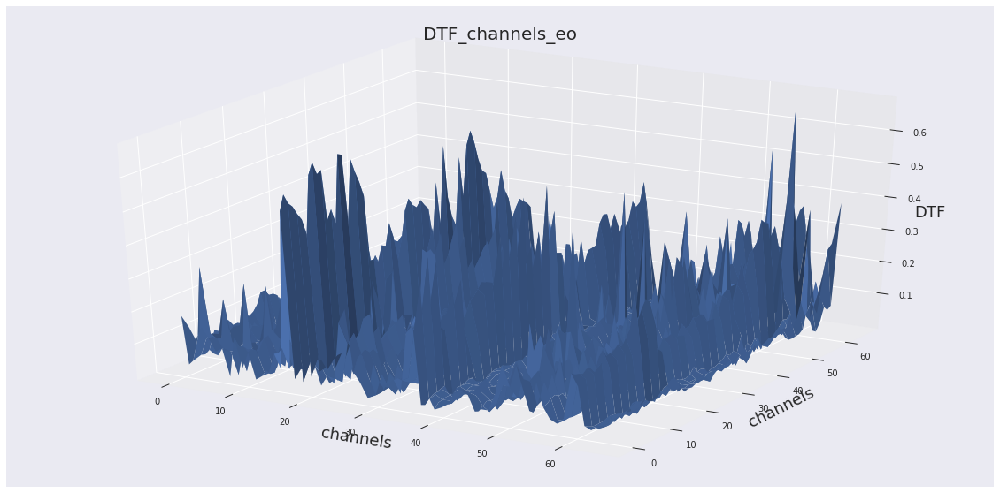

In [189]:
plot_3D(X, Y, Z_dtf_eo, "channels", "channels", "DTF", "DTF_channels_eo", True)

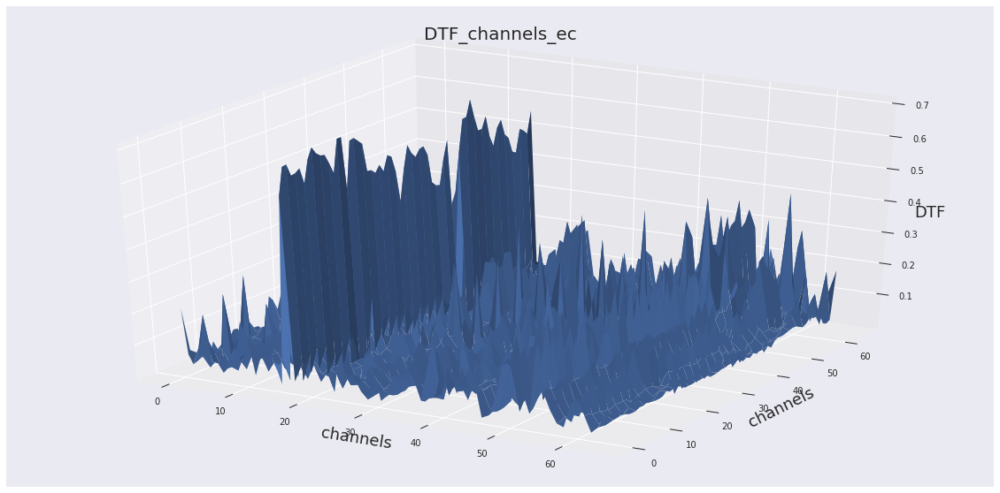

In [190]:
plot_3D(X, Y, Z_dtf_ec, "channels", "channels", "DTF", "DTF_channels_ec", True)

### PDC between all channels | fixed frequency using PDC

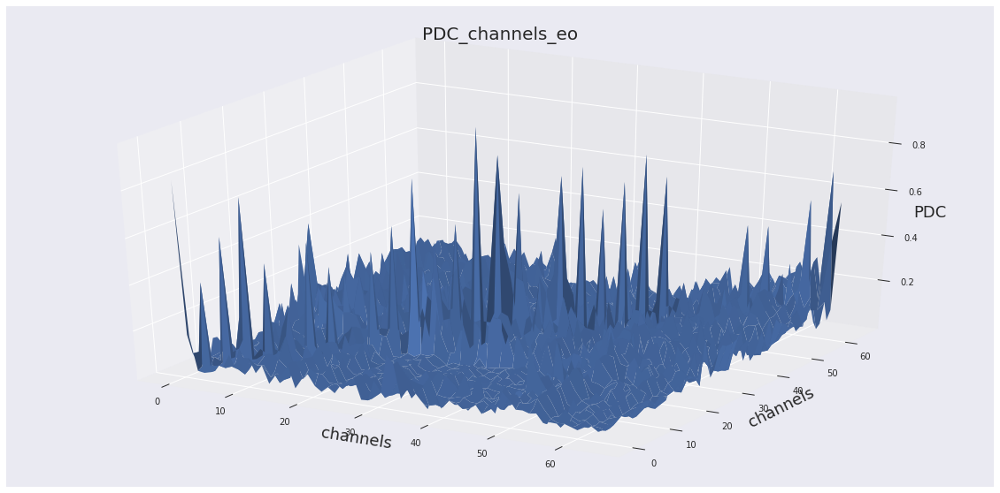

In [191]:
plot_3D(X, Y, Z_pdc_eo, "channels", "channels", "PDC", "PDC_channels_eo", True)

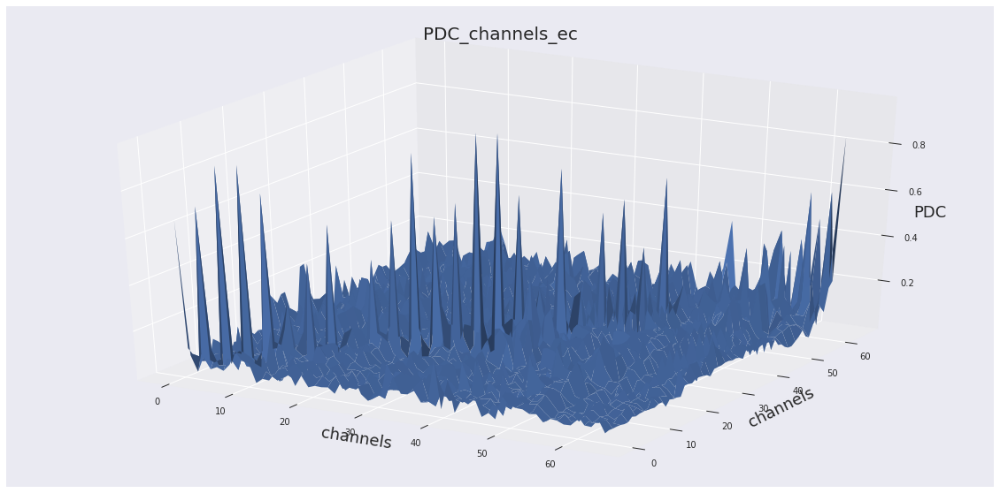

In [192]:
plot_3D(X, Y, Z_pdc_ec, "channels", "channels", "PDC", "PDC_channels_ec", True)

### DTF between (1,2) vs frequency

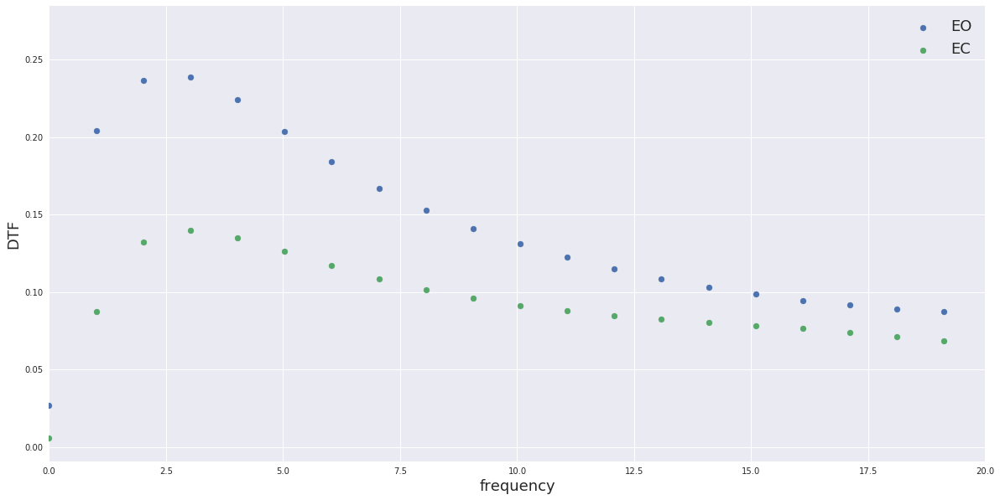

In [194]:
plt.figure(figsize=(20,10))
plt.scatter(ff,dtf_matrices_eo[:, 1, 2], marker="o")
plt.scatter(ff,dtf_matrices_ec[:, 1, 2], marker="o")
plt.xlim(0,20)
plt.xlabel("frequency", fontsize=18)
plt.ylabel("DTF", fontsize=18)
plt.legend(["EO", "EC"],  fontsize=18)
plt.grid()
plt.savefig("dtf_freq.pdf", format="pdf")
plt.show()

### thresholding for density DTF

In [154]:
def thresholding(dtf, th=0.2, flag=True):
    thresh=np.linspace(0, 1 , 1000)
    for t in thresh:
        dtfval_copy=dtf.copy()
        dtfval_copy[dtfval_copy<t]=0
        if flag:
            dtfval_copy[dtfval_copy!=0] = 1
        d = nx.density(nx.DiGraph(dtfval_copy))
        if d < th*(1.02) and d > th*(0.98):
            return dtfval_copy
    return None    

In [155]:
Z_dtf_t_eo = thresholding(Z_dtf_eo, 0.2)
Z_dtf_t_ec = thresholding(Z_dtf_ec, 0.2)

Z_pdc_t_eo = thresholding(Z_pdc_eo, 0.2)
Z_pdc_t_ec = thresholding(Z_pdc_ec, 0.2)

In [156]:
G_dtf_eo = nx.DiGraph(Z_dtf_t_eo)
G_dtf_ec = nx.DiGraph(Z_dtf_t_ec)

G_pdc_eo = nx.DiGraph(Z_pdc_t_eo)
G_pdc_ec = nx.DiGraph(Z_pdc_t_ec)

In [157]:
for g in [G_dtf_eo, G_dtf_ec, G_pdc_eo, G_pdc_ec]:
    print(nx.density(g))

0.2021329365079365
0.20238095238095238
0.20362103174603174
0.19890873015873015


In [158]:
def plot_graph(G, pos, name="", flag=False):
    plt.figure(figsize=(20,20))
    nx.draw_networkx(G, pos=pos, arrows=True, edge_color="green", node_color="red", 
                     node_size=500, node_shape="o", font_size=20, alpha=0.5, linewidths =10, width=2)
    plt.grid()
    plt.title(name, fontsize=20)
    if flag:
        plt.savefig(name, format="pdf")
    plt.show()

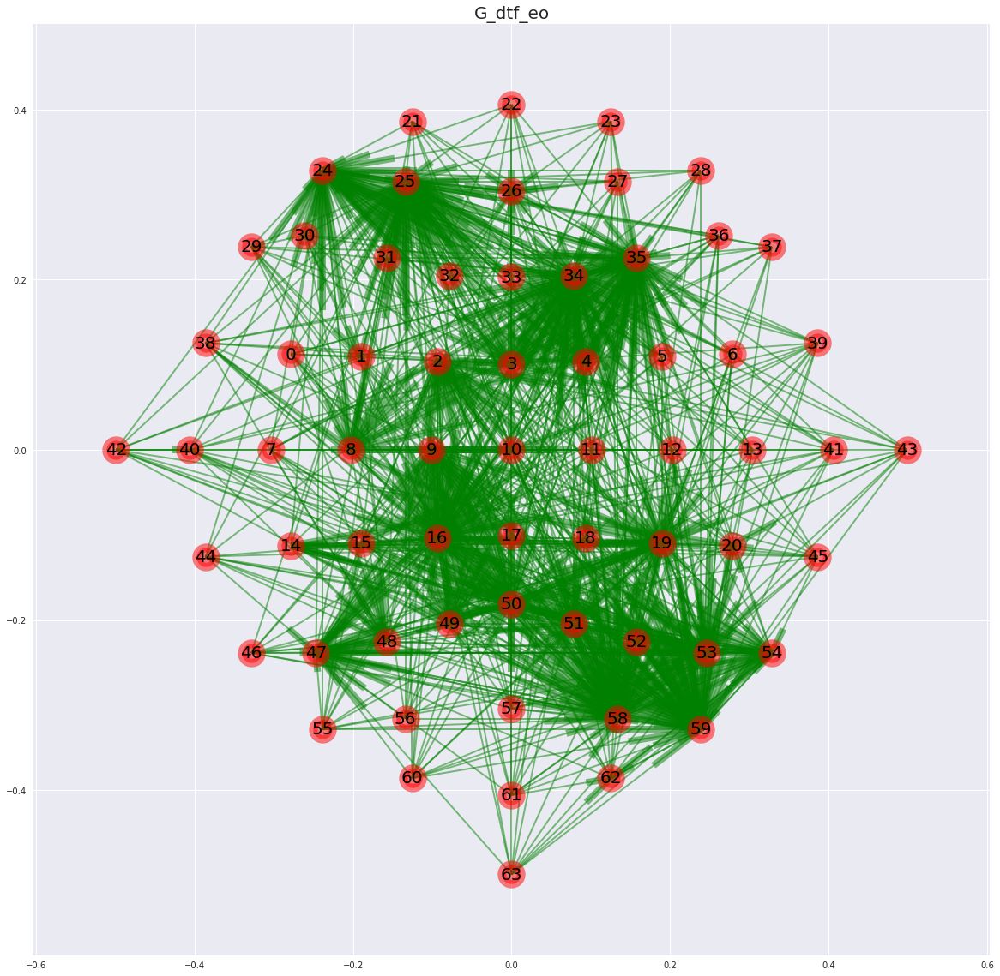

In [159]:
plot_graph(G_dtf_eo, position, "G_dtf_eo", True)

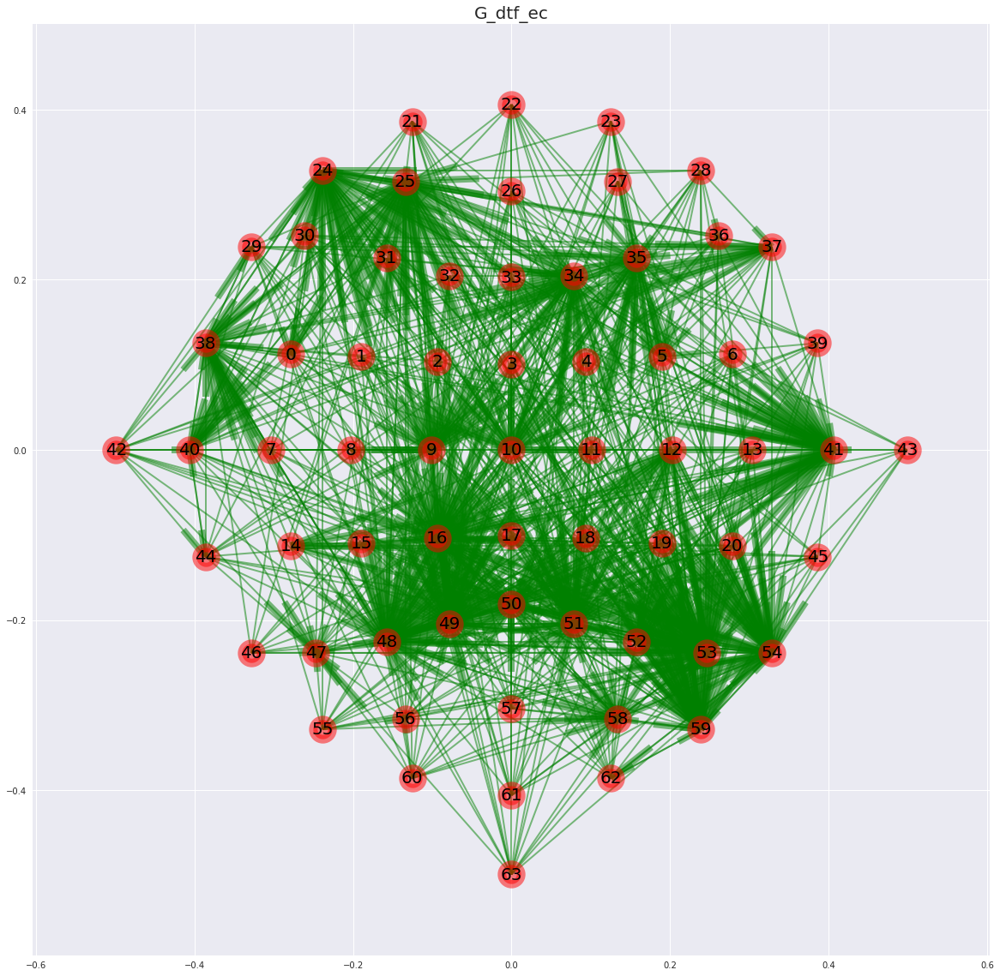

In [160]:
plot_graph(G_dtf_ec, position, "G_dtf_ec", True)

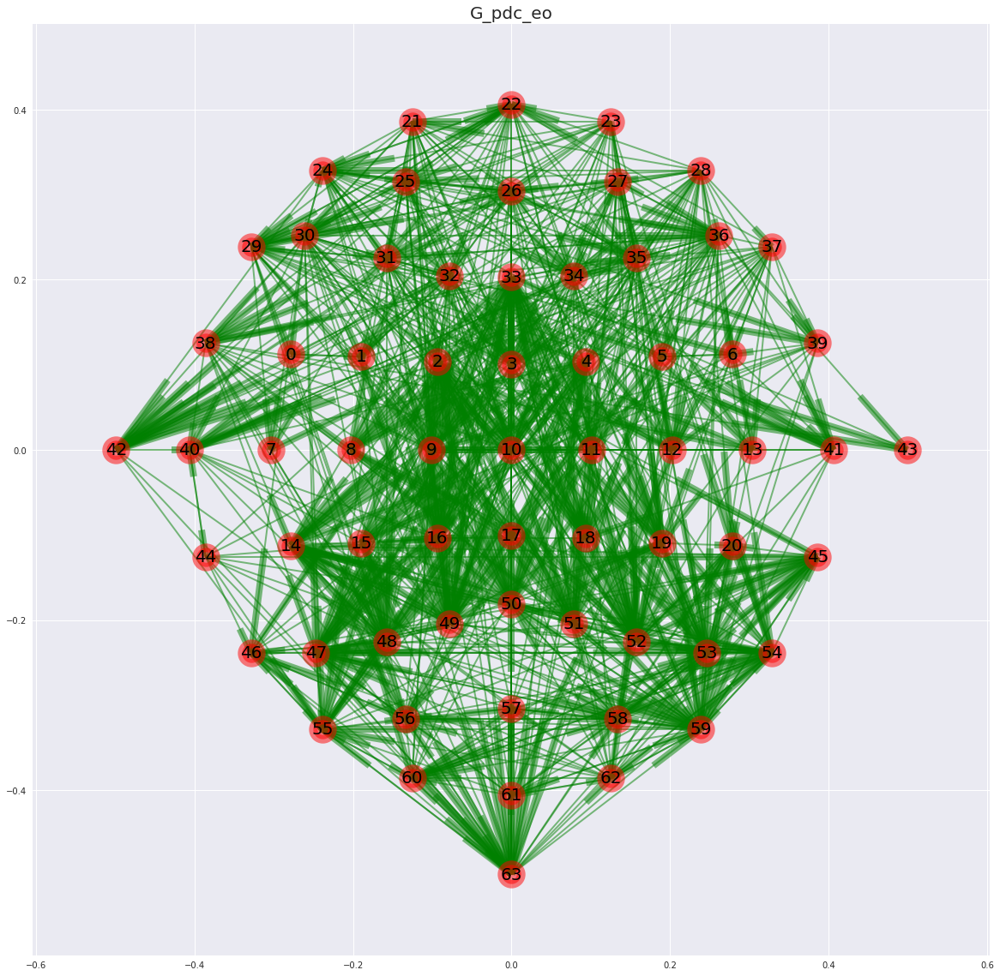

In [161]:
plot_graph(G_pdc_eo, position, "G_pdc_eo", True)

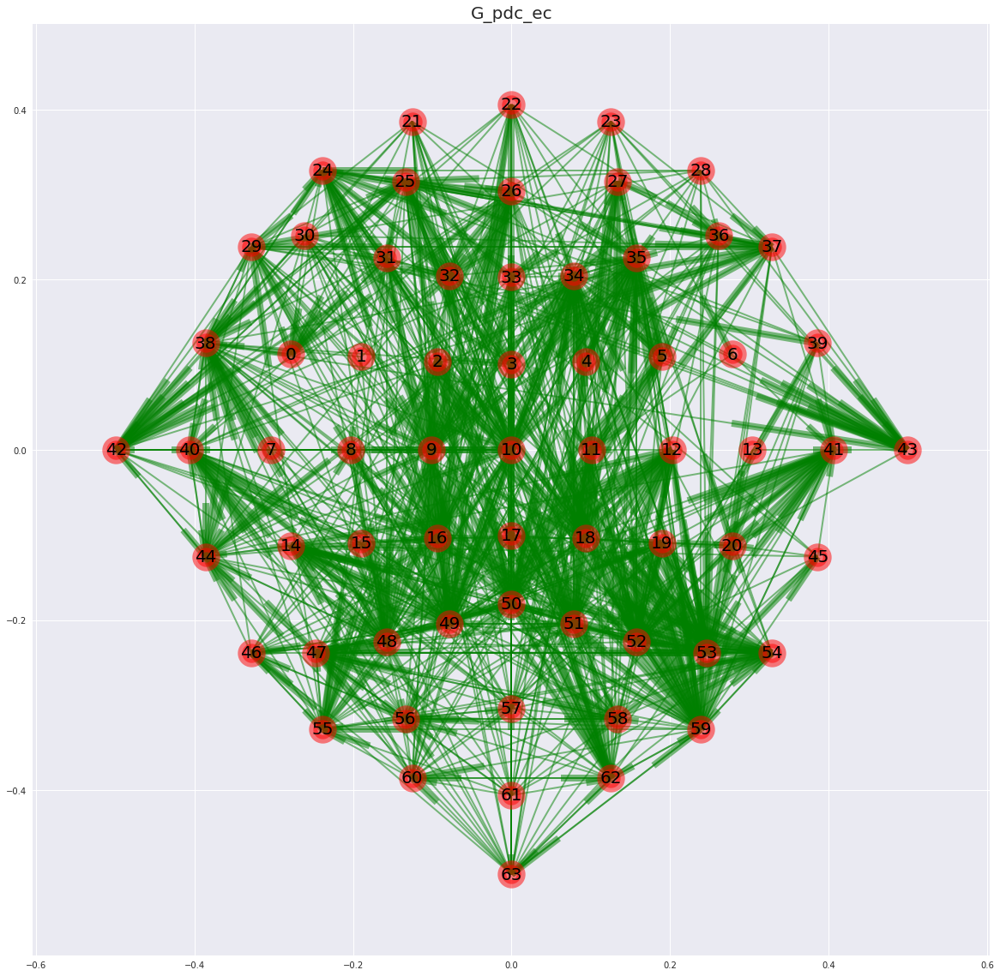

In [162]:
plot_graph(G_pdc_ec, position, "G_pdc_ec", True)

### 2.3) Perform task 2.1 using thresholds yielding the following density values: 1%, 5%, 10%, 20%, 30%, 50%

In [195]:
thresh = [0.01, 0.05, 0.1, 0.2, 0.3, 0.5]

In [196]:
thresh_eo={str(t):"" for t in thresh}
thresh_ec={str(t):"" for t in thresh}

for t in thresh:
    thresh_eo[str(t)]=thresholding(Z_dtf_eo, th=t)
    thresh_ec[str(t)]=thresholding(Z_dtf_ec, th=t)

In [357]:
z_01_eo = thresh_eo["0.1"]
z_01_ec = thresh_ec["0.1"]

In [358]:
G_01_eo=nx.DiGraph(z_01_eo)
G_01_ec=nx.DiGraph(z_01_ec)

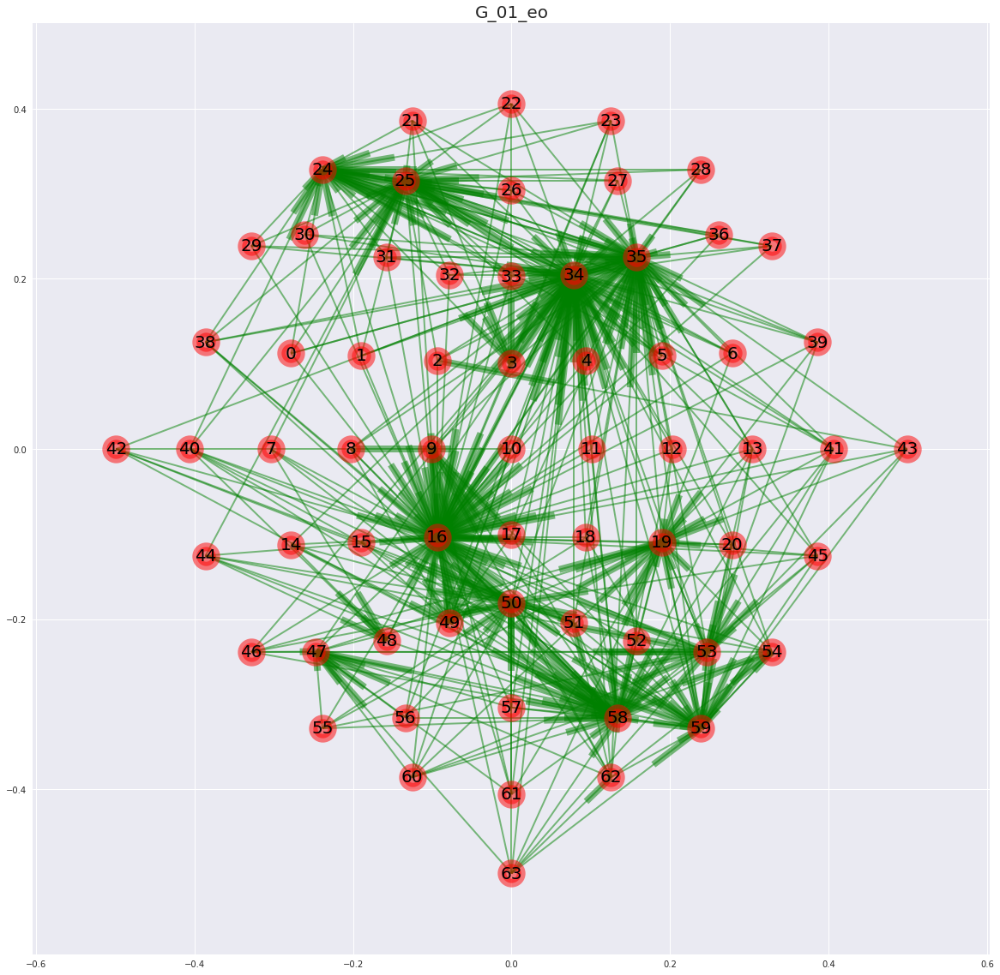

In [359]:
plot_graph(G_01_eo, position, "G_01_eo", True)

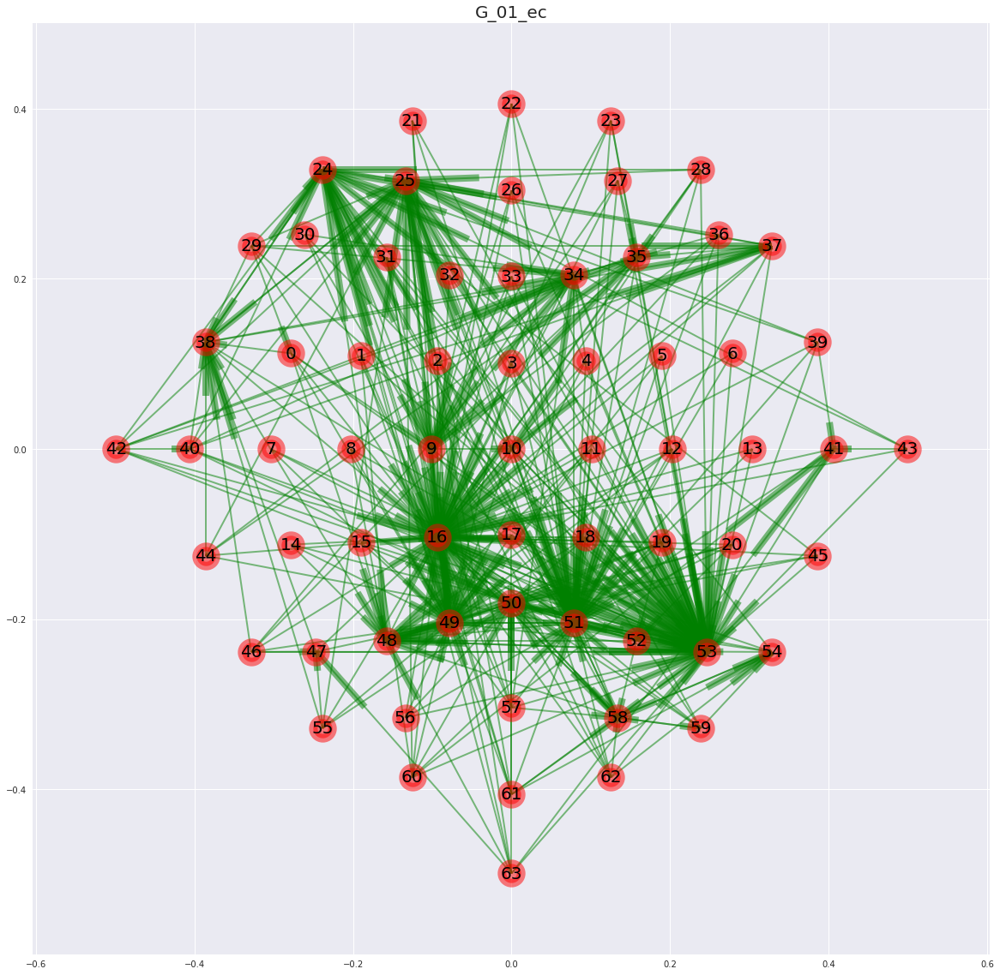

In [360]:
plot_graph(G_01_ec, position, "G_01_ec", True)

In [361]:
z_005_eo = thresh_eo["0.05"]
z_005_ec = thresh_ec["0.05"]

In [362]:
G_005_eo=nx.DiGraph(z_005_eo)
G_005_ec=nx.DiGraph(z_005_ec)

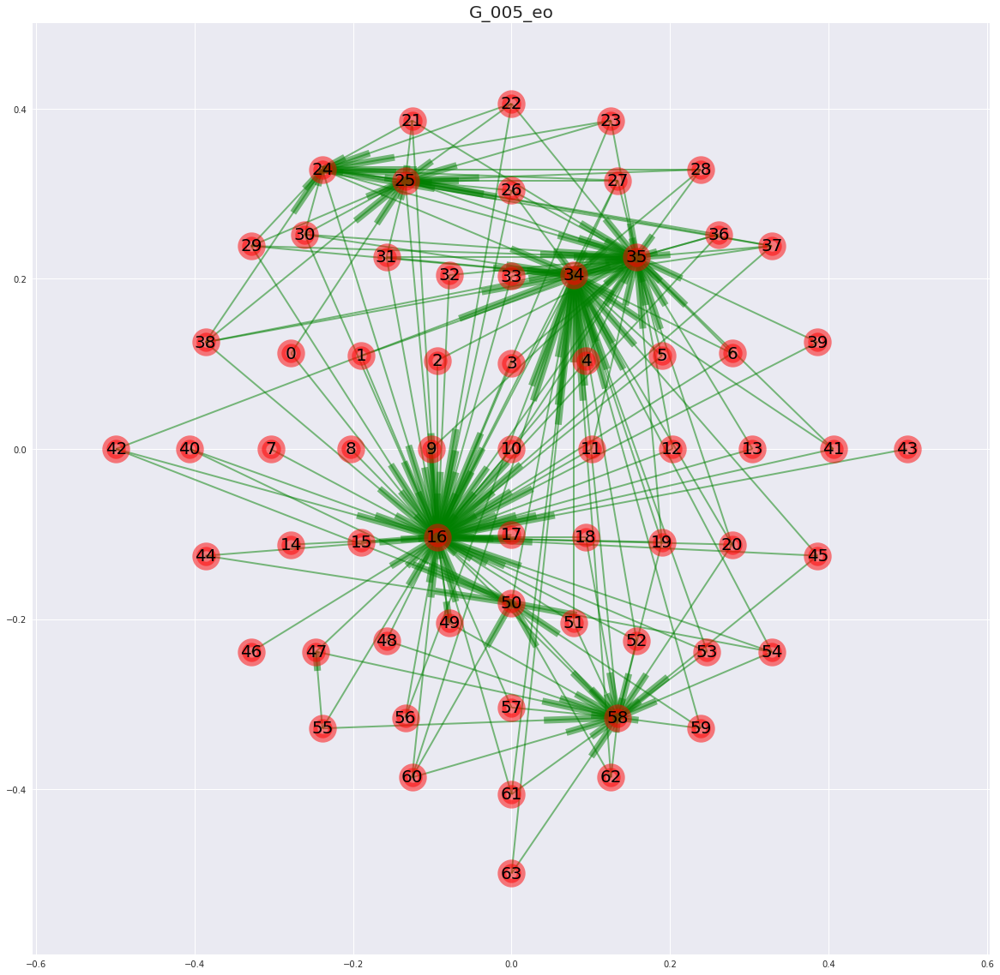

In [363]:
plot_graph(G_005_eo, position, "G_005_eo", True)

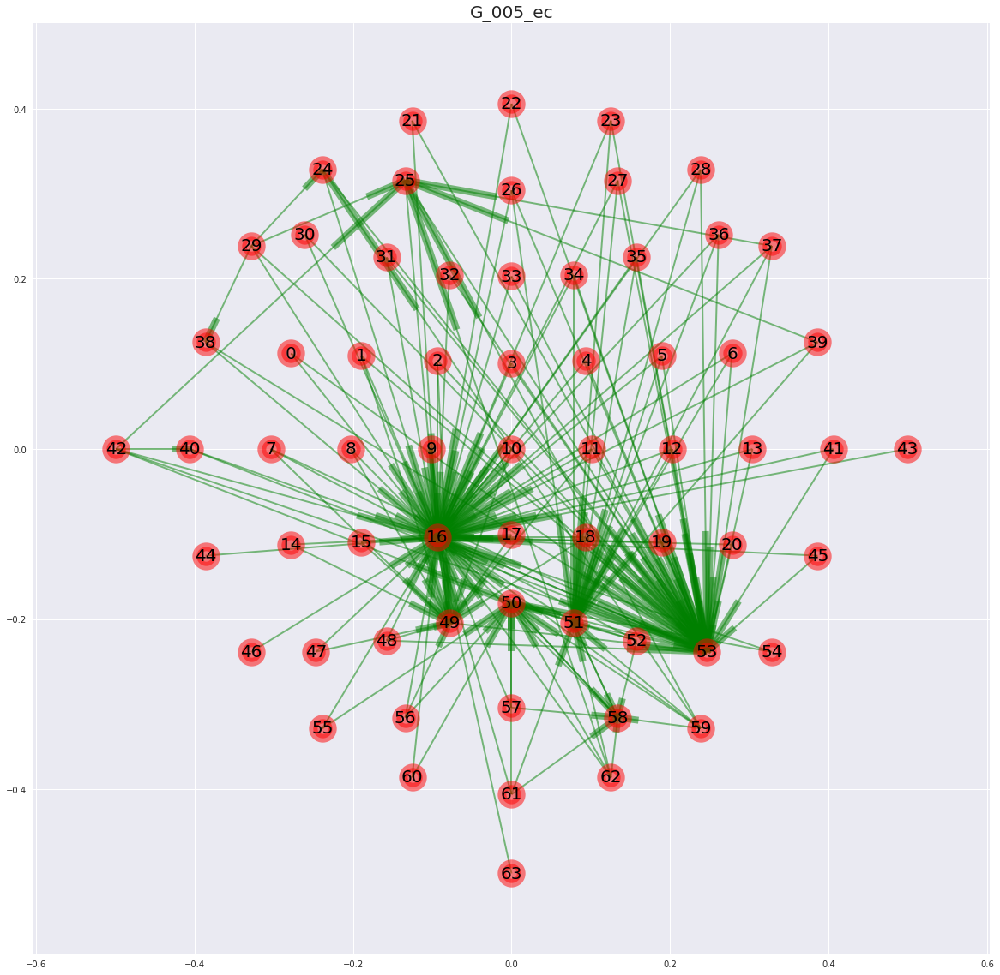

In [364]:
plot_graph(G_005_ec, position, "G_005_ec", True)

In [365]:
z_001_eo = thresh_eo["0.01"]
z_001_ec = thresh_ec["0.01"]

In [366]:
G_001_eo=nx.DiGraph(z_001_eo)
G_001_ec=nx.DiGraph(z_001_ec)

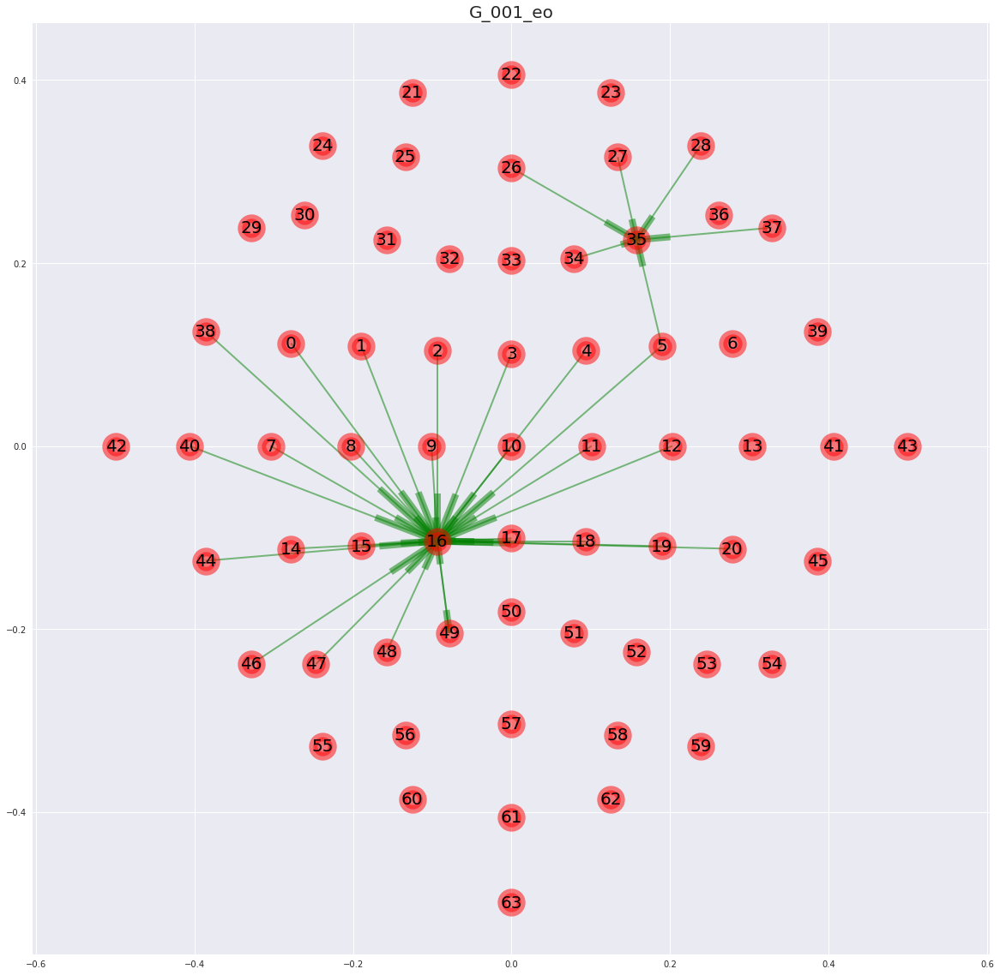

In [367]:
plot_graph(G_001_eo, position, "G_001_eo", True)

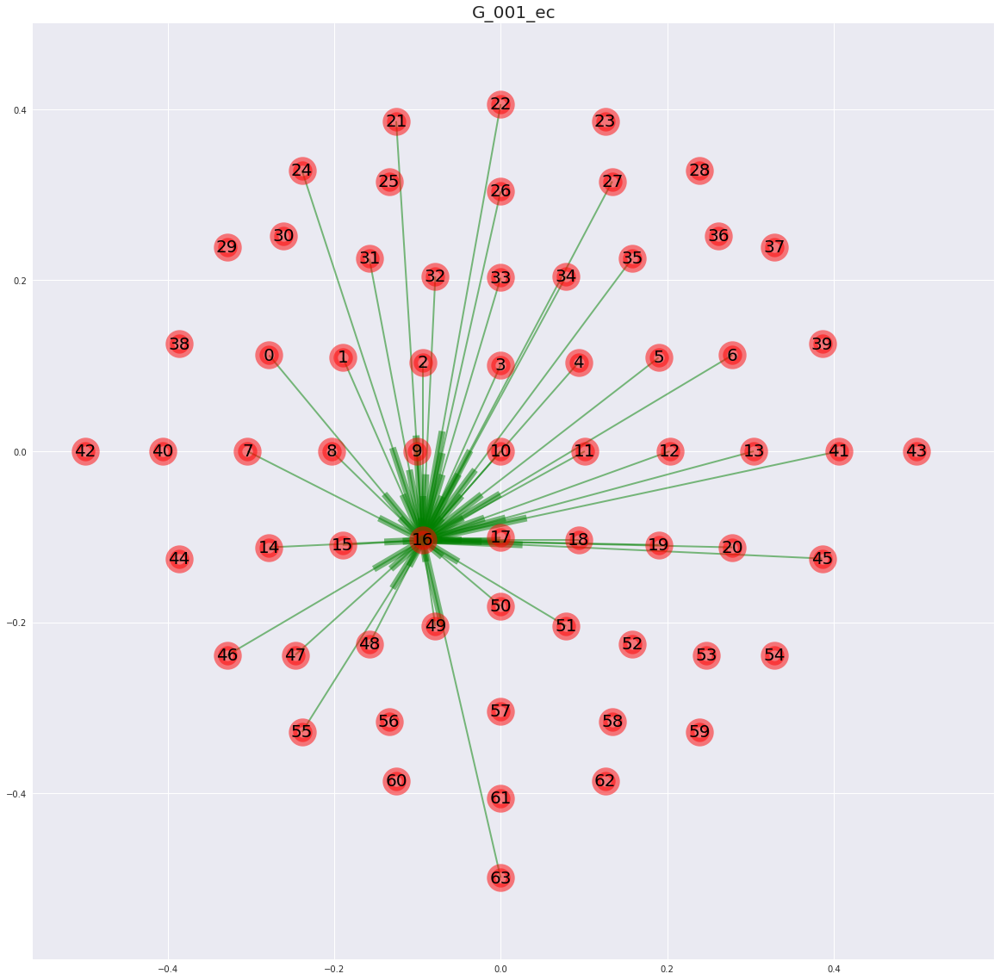

In [368]:
plot_graph(G_001_ec, position, "G_001_ec", True)

### 2.4) Considering the subset of 19 channels suggested in Figure 1 and Table 2, estimate the connectivity using PDC or DTF and apply a statistical validation method (asymptotic statistics 7 , resampling procedure 8 ,...) to filter out values that are not significantly different from 0 ( P DC(i, j ) = / 0 with p < 5 % ).

In [197]:
reduced_set=["Fp1", "Fp2", "F7", "F3", "Fz", "F4", "F8", "T7", "C3", "Cz", "C4", "T8", "P7", "P3", "Pz", "P4", "P8", "O1", "O2"]

reduced_set=["Fp1.", "Fp2."] + [i+".." for i in reduced_set[2:]]

signal_labels19=[i for i in range(len(signal_labels)) if signal_labels[i] in reduced_set]

In [198]:
signal_labels19

[8, 10, 12, 21, 23, 29, 31, 33, 35, 37, 40, 41, 46, 48, 50, 52, 54, 60, 62]

In [203]:
best_reduced_eo, crit_reduced_eo, data_reduced_eo = AR_model(signals[signal_labels19,:,0])
best_reduced_ec, crit_reduced_ec, data_reduced_ec = AR_model(signals[signal_labels19,:,1])

In [204]:
dtf_matrices_reduced_eo, dtf_eo = AR_fit(data_reduced_eo, best_reduced_eo, flag="dtf")
dtf_matrices_reduced_ec, dtf_ec = AR_fit(data_reduced_ec, best_reduced_ec, flag="dtf")

In [205]:
Z_reduced_eo = dtf_matrices_reduced_eo[ix]
Z_reduced_ec = dtf_matrices_reduced_ec[ix]

In [206]:
dtf_significance_eo = dtf_eo.significance(Z_reduced_eo, Nrep=100, alpha=0.05, method="yw")
dtf_significance_ec = dtf_ec.significance(Z_reduced_ec, Nrep=100, alpha=0.05, method="yw")

. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . |
. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . |


In [207]:
Z_reduced_eo[dtf_significance_eo<0.05] = 0
Z_reduced_ec[dtf_significance_ec<0.05] = 0

In [208]:
Z_reduced_ec.shape

(19, 19)

### 2.5) Make a topographical representation of of the networks

In [209]:
G_reduced_eo=nx.DiGraph(Z_reduced_eo)
G_reduced_ec=nx.DiGraph(Z_reduced_ec)

In [210]:
position19=[position[i] for i in signal_labels19]

In [211]:
labels19=[signal_labels[i] for i in signal_labels19]

In [212]:
mapping_nodes = {k:v for k,v in enumerate(labels19)}

In [213]:
mapping_position = {k:v for k,v in zip(labels19, position19)}

In [214]:
G_reduced_eo=nx.relabel_nodes(G_reduced_eo, mapping_nodes)
G_reduced_ec=nx.relabel_nodes(G_reduced_ec, mapping_nodes)

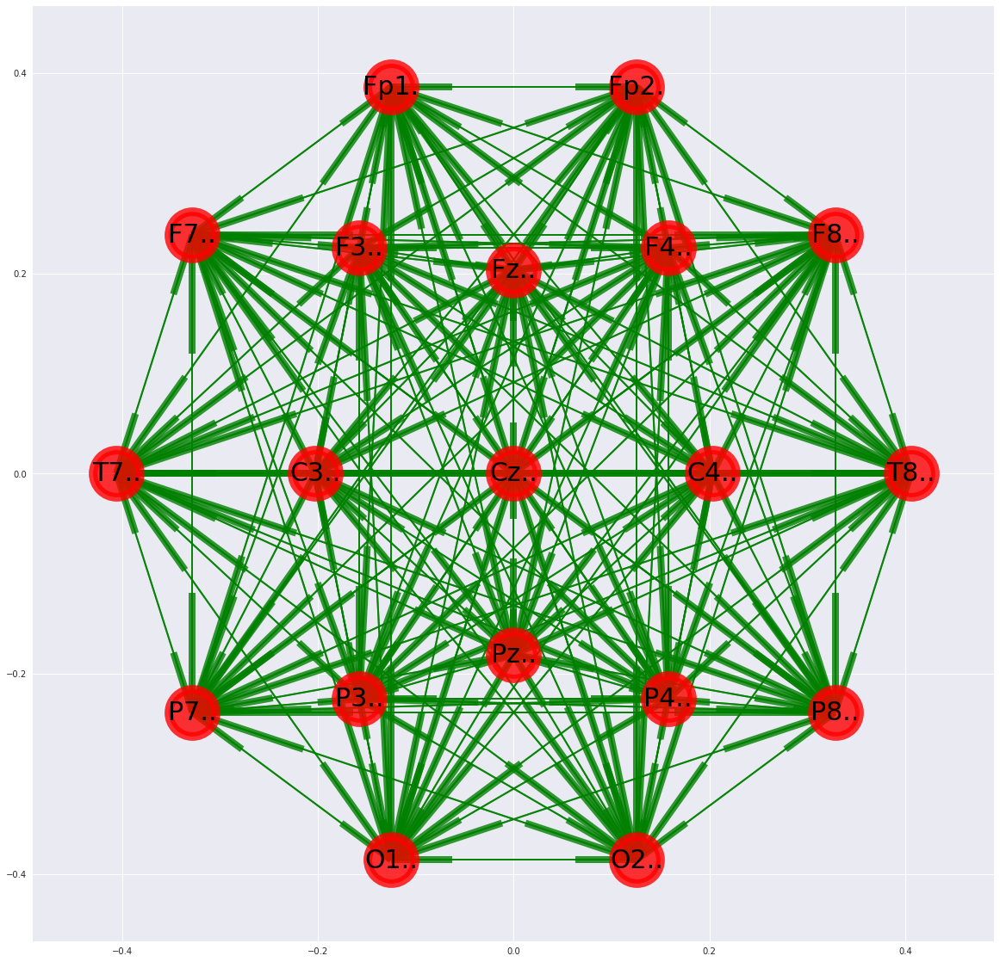

In [215]:
plt.figure(figsize=(20,20))
nx.draw_networkx(G_reduced_eo, pos=mapping_position, arrows=True,
                 edge_color="green", node_color="red", node_size=3000, node_shape="o", font_size=30, alpha=0.8,
                linewidths =10, width=2)
plt.grid()
plt.savefig("graph19_eo", format="pdf")
plt.show()

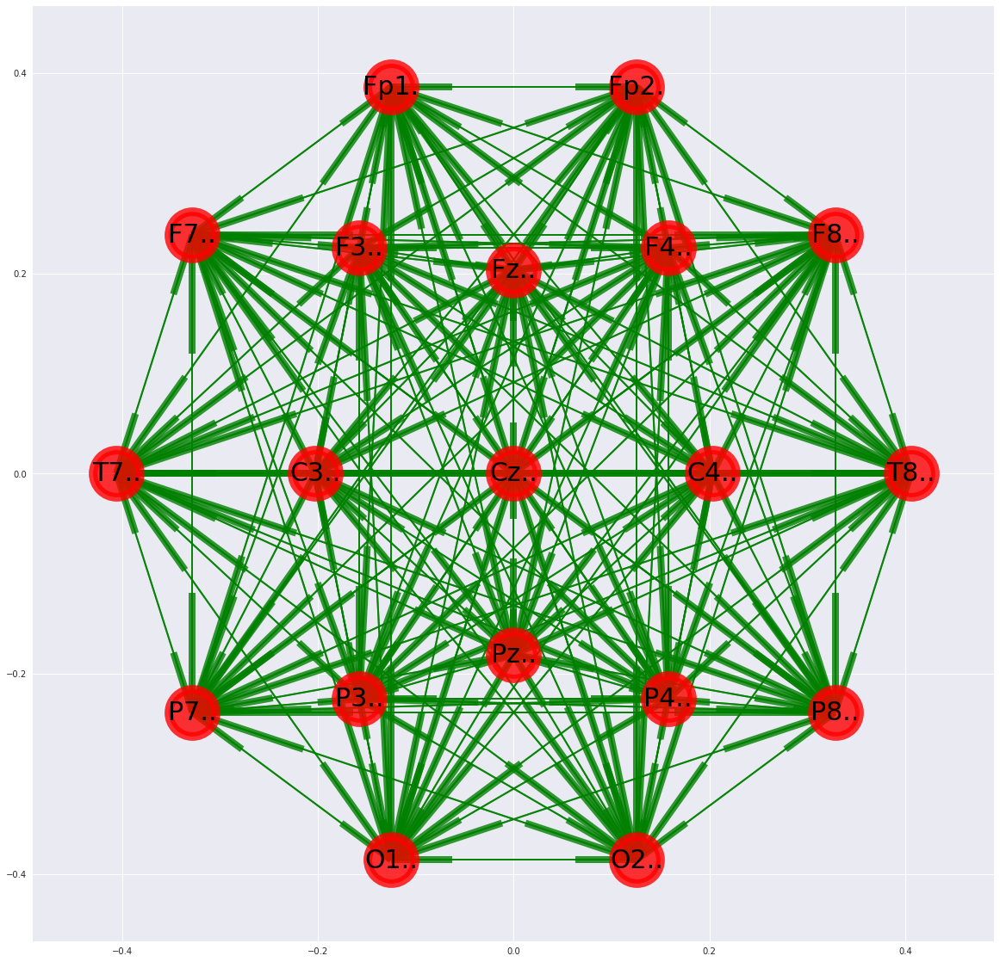

In [216]:
plt.figure(figsize=(20,20))
nx.draw_networkx(G_reduced_ec, pos=mapping_position, arrows=True,
                 edge_color="green", node_color="red", node_size=3000, node_shape="o", font_size=30, alpha=0.8,
                linewidths =10, width=2)
plt.grid()
plt.savefig("graph19_ec", format="pdf")
plt.show()

# Graph theory

### 3.1) Compute binary global (clustering coefficient, path length) and local (degree, in/out-degree) graph indices. List the highest 10 channels for local indices.

In [217]:
def compute_global(g):
    g_u = g.to_undirected()
    g_u = max(nx.connected_component_subgraphs(g_u), key=len)
    clustering_coeff=nx.average_clustering(g_u)
    shortest_path_length=nx.average_shortest_path_length(g_u)
    return clustering_coeff, shortest_path_length

In [218]:
def compute_local(g):
    d=g.degree()
    d_list=sorted([(k, d[k]) for k in d], key=lambda u:u[1], reverse=True)

    d_in=nx.DiGraph(g).in_degree()
    d_list_in=sorted([(k, d_in[k]) for k in d_in], key=lambda u:u[1], reverse=True)

    d_out=nx.DiGraph(g).out_degree()
    d_list_out=sorted([(k, d_out[k]) for k in d_out], key=lambda u:u[1], reverse=True)
    
    return d_list, d_list_in, d_list_out

In [219]:
g_dtf_eo=nx.DiGraph(Z_dtf_t_eo)
g_dtf_ec=nx.DiGraph(Z_dtf_t_ec)

g_pdc_eo=nx.DiGraph(Z_pdc_t_eo)
g_pdc_ec=nx.DiGraph(Z_pdc_t_ec)

In [220]:
clustering_dtf_eo, path_dtf_eo = compute_global(g_dtf_eo)
clustering_dtf_ec, path_dtf_ec = compute_global(g_dtf_ec)

clustering_pdc_eo, path_pdc_eo = compute_global(g_pdc_eo)
clustering_pdc_ec, path_pdc_ec = compute_global(g_pdc_ec)

In [221]:
res_global = {"DTF_EO": {"clust": clustering_dtf_eo , "path": path_dtf_eo}, 
            "DTF_EC": {"clust": clustering_dtf_ec , "path": path_dtf_ec},
            "PDC_EO": {"clust": clustering_pdc_eo , "path": path_pdc_eo},
            "PDC_EC": {"clust": clustering_pdc_ec , "path": path_pdc_ec}}

In [222]:
global_df = pd.DataFrame(res_global).T

In [228]:
global_df

,clust,path
DTF_EC,0.761281,1.660714
DTF_EO,0.781575,1.663194
PDC_EC,0.483545,1.734127
PDC_EO,0.530942,1.675595


In [239]:
d_eo, d_in_eo, d_out_eo = compute_local(g_dtf_eo)
d_ec, d_in_ec, d_out_ec = compute_local(g_dtf_ec)

In [264]:
def process_local(d, d_in, d_out):
    res_local = {"degree":[], "in_degree": [], "out_degree": []}
    
    d_dict = {i:[] for i in range(64)}
    for i in d:
        d_dict[i[0]].append(i[1])
    for i in d_in:
        d_dict[i[0]].append(i[1])
    for i in d_out:
        d_dict[i[0]].append(i[1])
        
    for i in d:
        res_local["degree"].append(d_dict[i[0]][0])
        res_local["in_degree"].append(d_dict[i[0]][1])
        res_local["out_degree"].append(d_dict[i[0]][2])
        
    index=[i[0] for i in d]
    index_name=[signal_labels[i] for i in index]
    local=pd.DataFrame(res_local, index=index_name)
    return local

In [265]:
local_eo = process_local(d_eo, d_in_eo, d_out_eo)
local_ec = process_local(d_ec, d_in_ec, d_out_ec)

In [266]:
table_local_eo=local_eo[:20]
table_local_ec=local_ec[:20]

### 3.5) Make a topographical representation of local indices

In [231]:
def plot_degree_graph(g, color, name, c_min, c_max, flag=False):
    plt.figure(figsize=(20,20))
    nx.draw_networkx(g, pos=position, arrows=True, labels={k:v for k,v in enumerate(signal_labels)},
                     edge_color="green", node_color=color, node_size=1000, node_shape="o", font_size=30,
                    linewidths =10, width=2, edgelist=[ ], cmap=plt.cm.autumn_r, vmin=c_min, vmax=c_max)
    
    cmap=plt.cm.autumn_r
    vmin = c_min
    vmax = c_max
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm.set_array(color)
    plt.colorbar(sm)
    plt.grid()
    plt.title(name, fontsize=30)
    if flag:
        plt.savefig(name, format="pdf")
    plt.show()

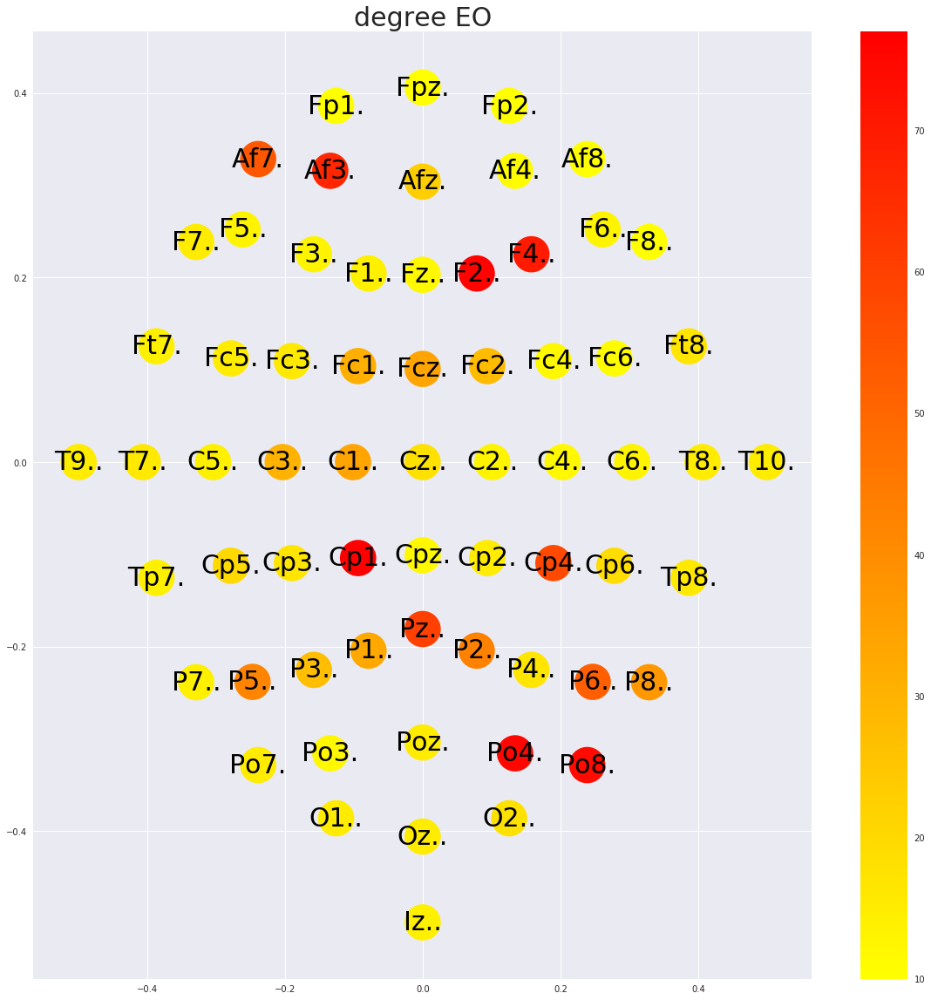

In [232]:
d_color_eo=[i[1] for i in sorted(d_eo)]
plot_degree_graph(g_dtf_eo, d_color_eo, "degree EO", min(d_color_eo), max(d_color_eo), True)

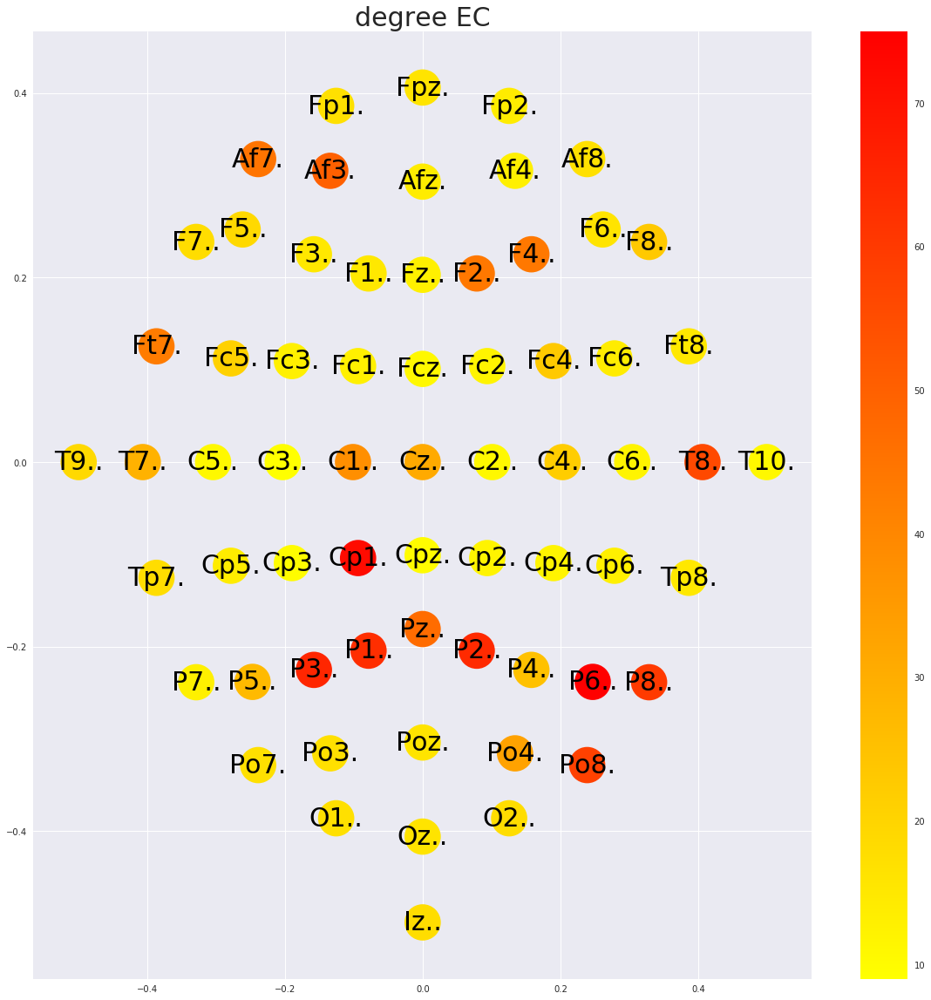

In [233]:
d_color_ec=[i[1] for i in sorted(d_ec)]
plot_degree_graph(g_dtf_ec, d_color_ec, "degree EC", min(d_color_ec), max(d_color_ec), True)

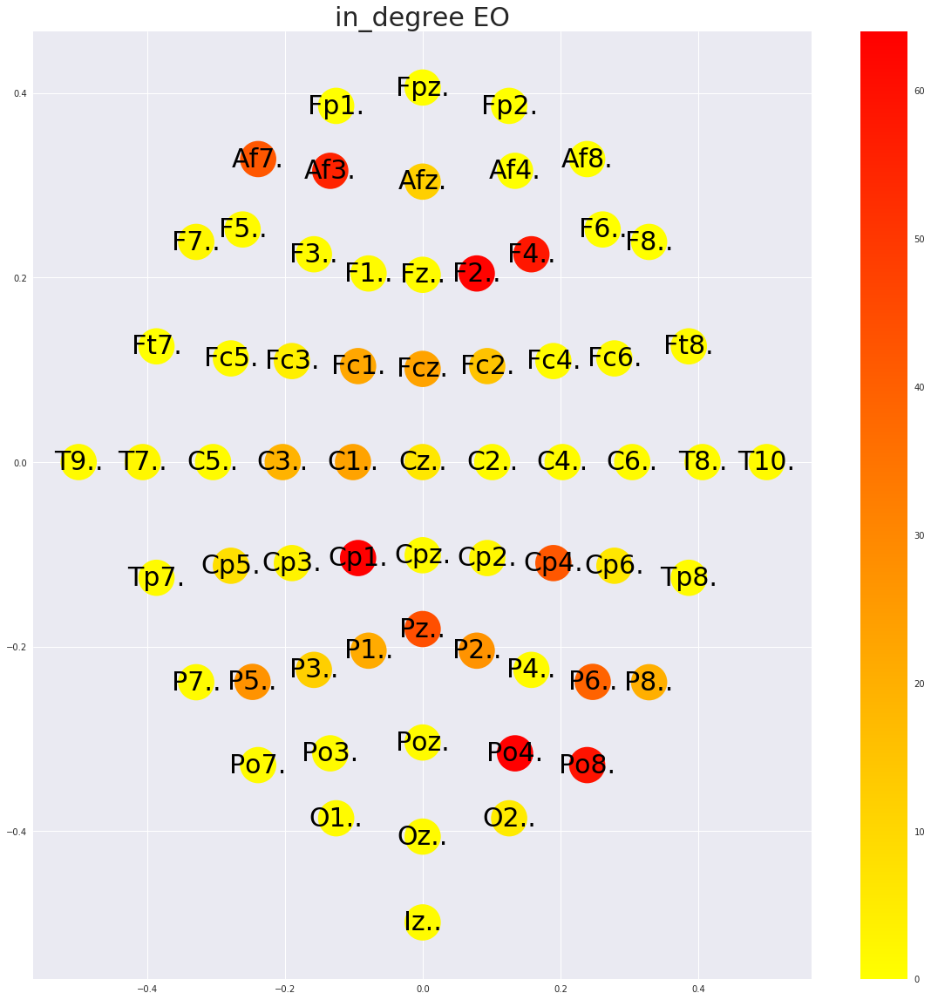

In [234]:
d_color_in_eo=[i[1] for i in sorted(d_in_eo)]
plot_degree_graph(g_dtf_eo, d_color_in_eo, "in_degree EO", min(d_color_in_eo), max(d_color_in_eo), True)

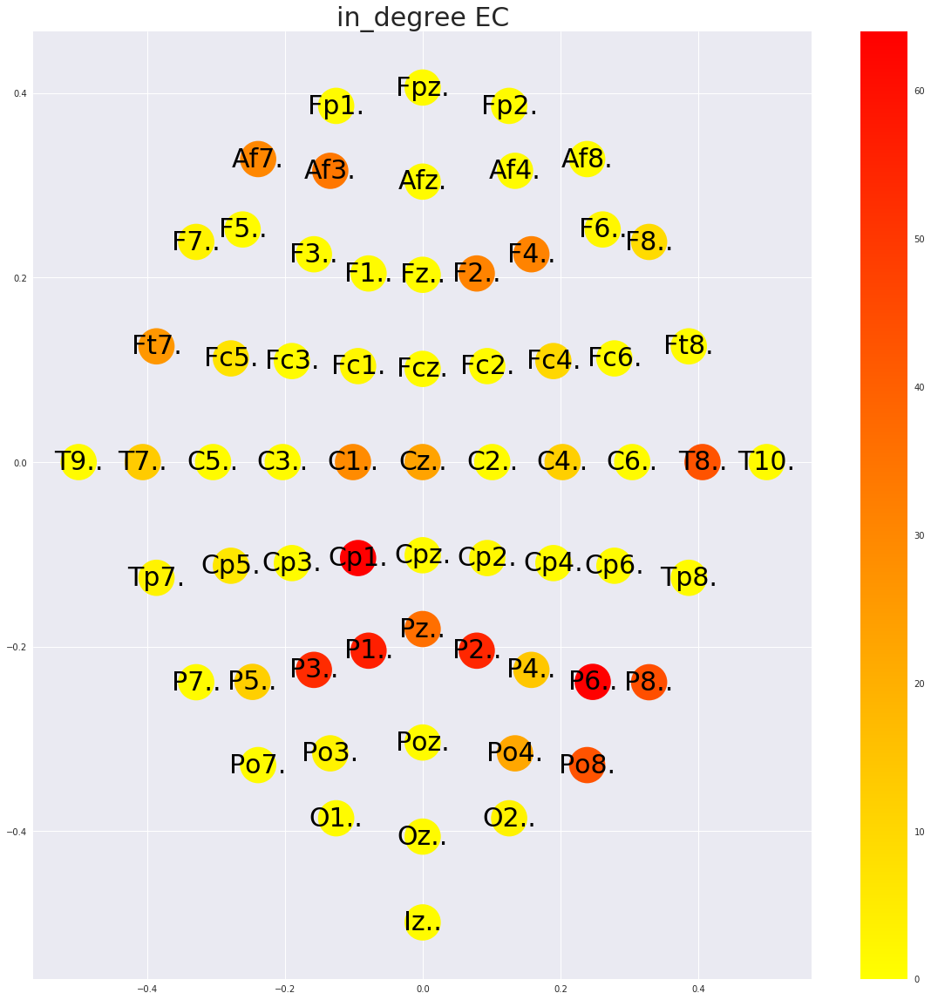

In [235]:
d_color_in_ec=[i[1] for i in sorted(d_in_ec)]
plot_degree_graph(g_dtf_ec, d_color_in_ec, "in_degree EC", min(d_color_in_eo), max(d_color_in_eo), True)

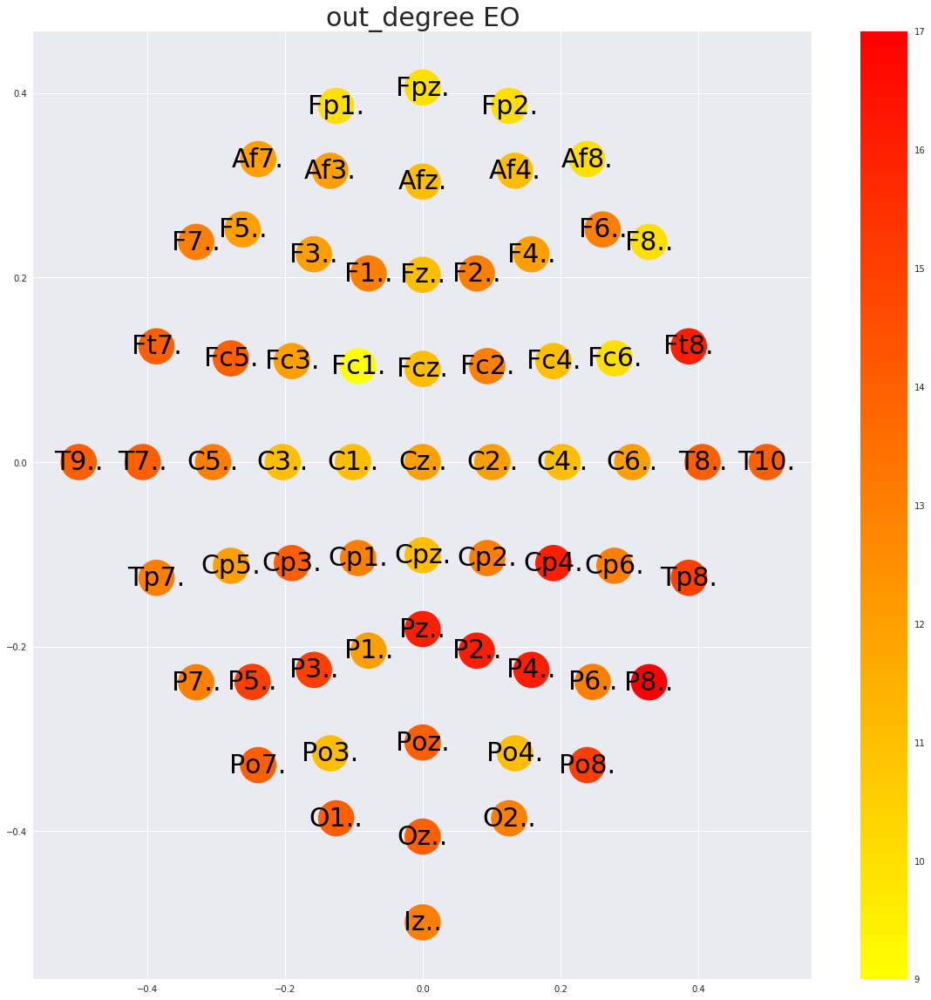

In [236]:
d_color_out_eo=[i[1] for i in sorted(d_out_eo)]
plot_degree_graph(g_dtf_eo, d_color_out_eo, "out_degree EO", min(d_color_out_eo), max(d_color_out_eo), True)

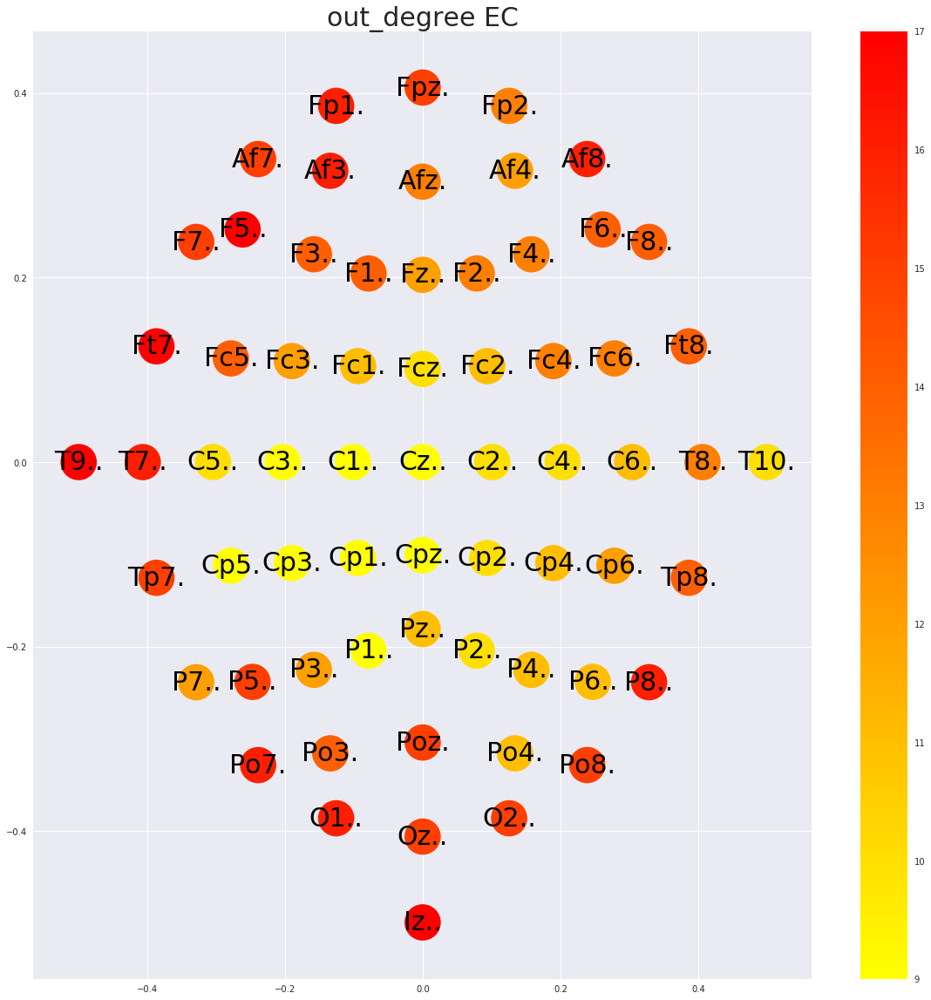

In [237]:
d_color_out_ec=[i[1] for i in sorted(d_out_ec)]
plot_degree_graph(g_dtf_ec, d_color_out_ec, "out_degree EC", min(d_color_out_eo), max(d_color_out_eo), True)

### 3.2) Search in the literature a definition of small-worldness index (i.e. an index describing the small-world organization of a network) and compute it.

### small-worldness index  ---> average shortest path ~ log(N)

[small-worldness](https://en.wikipedia.org/wiki/Small-world_network)

In [268]:
np.log10(signals.shape[0])

1.8061799739838871

In [269]:
G_random_eo = []
G_random_ec = []
for _ in range(100):
    G_random_eo.append(nx.erdos_renyi_graph(n=signals.shape[0], p=nx.density(g_dtf_eo)))
    G_random_ec.append(nx.erdos_renyi_graph(n=signals.shape[0], p=nx.density(g_dtf_ec)))

In [270]:
ClusteringRandom_eo=[]
PathRandom_eo=[]
ClusteringRandom_ec=[]
PathRandom_ec=[]

for i in range(100):
    c_r, p_r = compute_global(G_random_eo[i])
    ClusteringRandom_eo.append(c_r)
    PathRandom_eo.append(p_r)
    
    c_r, p_r = compute_global(G_random_ec[i])
    ClusteringRandom_ec.append(c_r)
    PathRandom_ec.append(p_r)

In [271]:
average_clustering_random_eo = np.mean(ClusteringRandom_eo)
average_clustering_random_ec = np.mean(ClusteringRandom_ec)

average_path_random_eo=np.mean(PathRandom_eo)
average_path_random_ec=np.mean(PathRandom_ec)

In [276]:
res={"clustering":[clustering_dtf_eo, clustering_dtf_ec], 
     "clustering_random": [average_clustering_random_eo, average_clustering_random_ec],
    "path": [path_dtf_eo, path_dtf_ec], "path_random": [average_path_random_eo, average_path_random_ec]}

In [277]:
pd.DataFrame(res)

,clustering,clustering_random,path,path_random
0,0.781575,0.202561,1.663194,1.855967
1,0.761281,0.200968,1.660714,1.856617


In [279]:
res=pd.DataFrame(res, index=["EO", "EC"])

In [280]:
sigma=res["clustering"]/res["clustering_random"] / res["path"]/ res["path_random"]

In [281]:
res["sigma"] = sigma

### $\sigma = \frac{C}{C_r} / \frac{P}{P_r}$

In [282]:
sigma > 1

EO    True
EC    True
dtype: bool

### 3.3) Compare the global indices extracted from PDC and DTF connectivity estimations

In [283]:
global_df

,clust,path
DTF_EC,0.761281,1.660714
DTF_EO,0.781575,1.663194
PDC_EC,0.483545,1.734127
PDC_EO,0.530942,1.675595


### 3.4) Study the behaviour of global graph indices in function of network density

In [284]:
thresh=[0.01, 0.05, 0.1, 0.2, 0.3, 0.5]

In [285]:
paths_eo = []
clusters_eo = []
paths_ec = []
clusters_ec = []

In [286]:
for th in thresh:
    g_th = nx.DiGraph(thresh_eo[str(th)])
    c_th, p_th = compute_global(g_th)
    clusters_eo.append(c_th)
    paths_eo.append(p_th)
    
    g_th = nx.DiGraph(thresh_ec[str(th)])
    c_th, p_th = compute_global(g_th)
    clusters_ec.append(c_th)
    paths_ec.append(p_th)

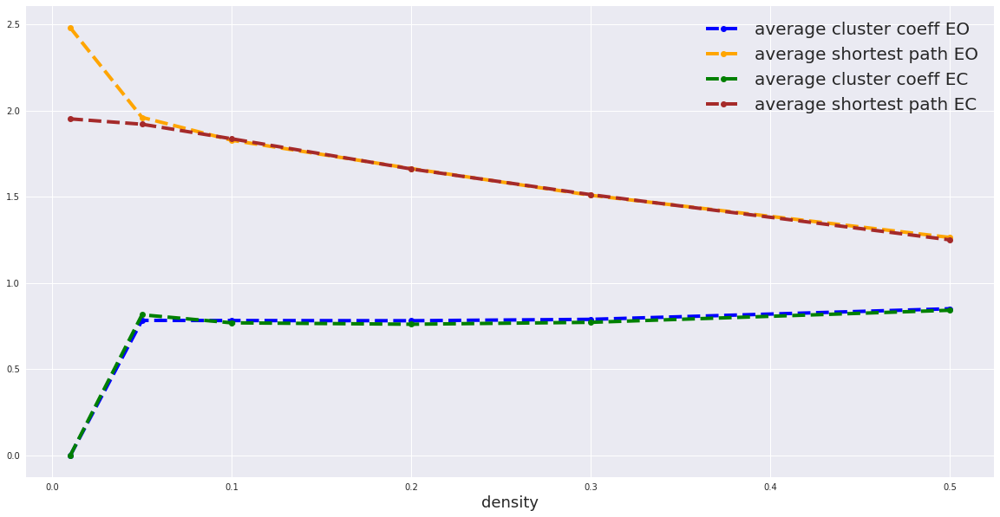

In [287]:
plt.figure(figsize=(20,10))
plt.plot(thresh, clusters_eo, "--o", linewidth=4.0, color="blue")
plt.plot(thresh, paths_eo, "--o", linewidth=4.0, color="orange")
plt.plot(thresh, clusters_ec, "--o", linewidth=4.0, color="green")
plt.plot(thresh, paths_ec, "--o", linewidth=4.0, color="brown")
plt.grid()
plt.xlabel('density', fontsize=18)
plt.legend(["average cluster coeff EO", "average shortest path EO", 
            "average cluster coeff EC", "average shortest path EC"], fontsize=20, ncol=1)
plt.savefig("thresh", format="pdf")
plt.show()

### 3.7) Perform point 3.1 considering the weighted version of the graph indices definitions.

In [288]:
Z_dtf_w_eo = thresholding(Z_dtf_eo, 0.2, False)
Z_dtf_w_ec = thresholding(Z_dtf_ec, 0.2, False)

In [289]:
g_w_eo = nx.DiGraph(Z_dtf_w_eo)
g_w_ec = nx.DiGraph(Z_dtf_w_ec)

In [290]:
clustering_w_eo, path_w_eo = compute_global(g_w_eo)
clustering_w_ec, path_w_ec = compute_global(g_w_ec)

In [291]:
res_global_w = {"DTF_EO": {"clust": clustering_w_eo , "path": path_w_eo}, 
            "DTF_EC": {"clust": clustering_w_ec , "path": path_w_ec}}

In [292]:
global_w=pd.DataFrame(res_global_w).T

In [293]:
w_eo, w_in_eo, w_out_eo = compute_local(g_w_eo)
w_ec, w_in_ec, w_out_ec = compute_local(g_w_ec)

In [294]:
local_w_eo=process_local(w_eo, w_in_eo, w_out_eo)
local_w_ec=process_local(w_ec, w_in_ec, w_out_ec)

# motif analysis

### 4.1) Perform motifs analysis to investigate the presence of 3-node configurations in the networks: determine their frequency and statistical significance (motifs, anti-motifs).

In [330]:
Z_dtf_t_eo = thresholding(Z_dtf_eo, 0.2)
Z_dtf_t_ec = thresholding(Z_dtf_ec, 0.2)

In [331]:
for i in range(64):
    Z_dtf_t_eo[i,i] = 0
    Z_dtf_t_ec[i,i] = 0

In [332]:
g_motif_eo=nx.DiGraph(Z_dtf_t_eo)
g_motif_ec=nx.DiGraph(Z_dtf_t_ec)

In [333]:
def generate_input_list(g, name):
    g_list = []
    ll = g.adj
    for i in ll:
        for j in ll[i]:
            g_list.append([int(i), int(j), 1])
    x=np.array(g_list, dtype=np.int8)
    np.savetxt(name, x, fmt='%i', delimiter=' ')
    return g_list

In [ ]:
g_dtf_list_eo=generate_input_list(g_motif_eo, "motif_input_eo.txt")
g_dtf_list_ec=generate_input_list(g_motif_ec, "motif_input_ec.txt")

In [ ]:
! mfinder motif_input_eo.txt -r 1000 -s 3 -omat -ospmem 36 -maxmem 10000

In [ ]:
! mfinder motif_input_ec.txt -r 1000 -s 3 -omat -ospmem 36 -maxmem 10000

In [334]:
motifs3_eo = np.loadtxt("./motifs/motif3/eo/motif_input_eo_MAT.txt")
motifs3_ec = np.loadtxt("./motifs/motif3/ec/motif_input_ec_MAT.txt")

In [369]:
def motifs_analysis(motifs3):
    indices = {"ix": [], "frequency": [], "statistical significance": []}
    for m in range(motifs3.shape[0]):
        motif=motifs3[m]
        indices["ix"].append(int(motif[0]))
        indices["frequency"].append(int(motif[1]))
        if motif[1] < motif[2] - 2*(abs(motif[3])):
            indices["statistical significance"].append("under-represented")
        elif motif[1] > motif[2] + 2*(abs(motif[3])):
            indices["statistical significance"].append("over-represented")
        else:
            indices["statistical significance"].append("normal-represented")
    return indices

In [370]:
indices3_eo=motifs_analysis(motifs3_eo)
indices3_ec=motifs_analysis(motifs3_ec)

In [371]:
motif3_eo_df = pd.DataFrame(indices3_eo, index=indices3_eo["ix"], columns=["frequency", "statistical significance"])
motif3_ec_df = pd.DataFrame(indices3_ec, index=indices3_ec["ix"], columns=["frequency", "statistical significance"])

In [377]:
motif3_eo_df

,frequency,statistical significance
6,196,under-represented
12,565,normal-represented
14,46,under-represented
36,8251,under-represented
38,1256,normal-represented
46,88,over-represented
74,1746,under-represented
78,33,under-represented
98,6,normal-represented
102,108,under-represented


In [375]:
motif3_ec_df

,frequency,statistical significance
6,434,under-represented
12,718,normal-represented
14,60,under-represented
36,7974,under-represented
38,1715,over-represented
46,131,over-represented
74,1462,normal-represented
78,53,under-represented
98,10,normal-represented
102,81,under-represented


### 4.2) For the motif with pattern A → B ← C , create a topographical representation of the networks considering only the connections​ involved in this configuration

In [340]:
motifs36_eo = np.loadtxt("./motifs/motif3/eo/motif_input_eo_MEMBERS.txt")
motifs36_ec = np.loadtxt("./motifs/motif3/ec/motif_input_ec_MEMBERS.txt")

In [341]:
len(motifs36_ec)

7973

In [342]:
len(motifs36_eo)

8251

In [343]:
def build_motif_graph(motifs36):
    m1 = motifs36[:,0:2]
    m2=np.column_stack([motifs36[:,2], motifs36[:,1]])
    m=np.vstack([m1, m2])
    m_list=list(m.astype(int))
    g_motifs36 = nx.DiGraph()
    for row in m_list:
        if not g_motifs36.has_node(row[0]):
            g_motifs36.add_node(row[0])
        if not g_motifs36.has_node(row[1]):
            g_motifs36.add_node(row[1])
        if not g_motifs36.has_edge(row[0], row[1]):
            g_motifs36.add_edge(row[0], row[1], weight=1)

        else:
            g_motifs36[row[0]][row[1]]["weight"] += 1
            
    nodes36=list(g_motifs36.node.keys())
    mapping_labels36={k:signal_labels[k] for k in nodes36}
    g_motifs36=nx.relabel_nodes(g_motifs36, mapping_labels36)
    position36={signal_labels[k]:position[k] for k in nodes36}
    edge_labels36=nx.get_edge_attributes(g_motifs36,'weight')
    return g_motifs36, position36, edge_labels36

In [344]:
g_motifs36_eo, position36_eo, edge_labels36_eo = build_motif_graph(motifs36_eo)
g_motifs36_ec, position36_ec, edge_labels36_ec = build_motif_graph(motifs36_ec)

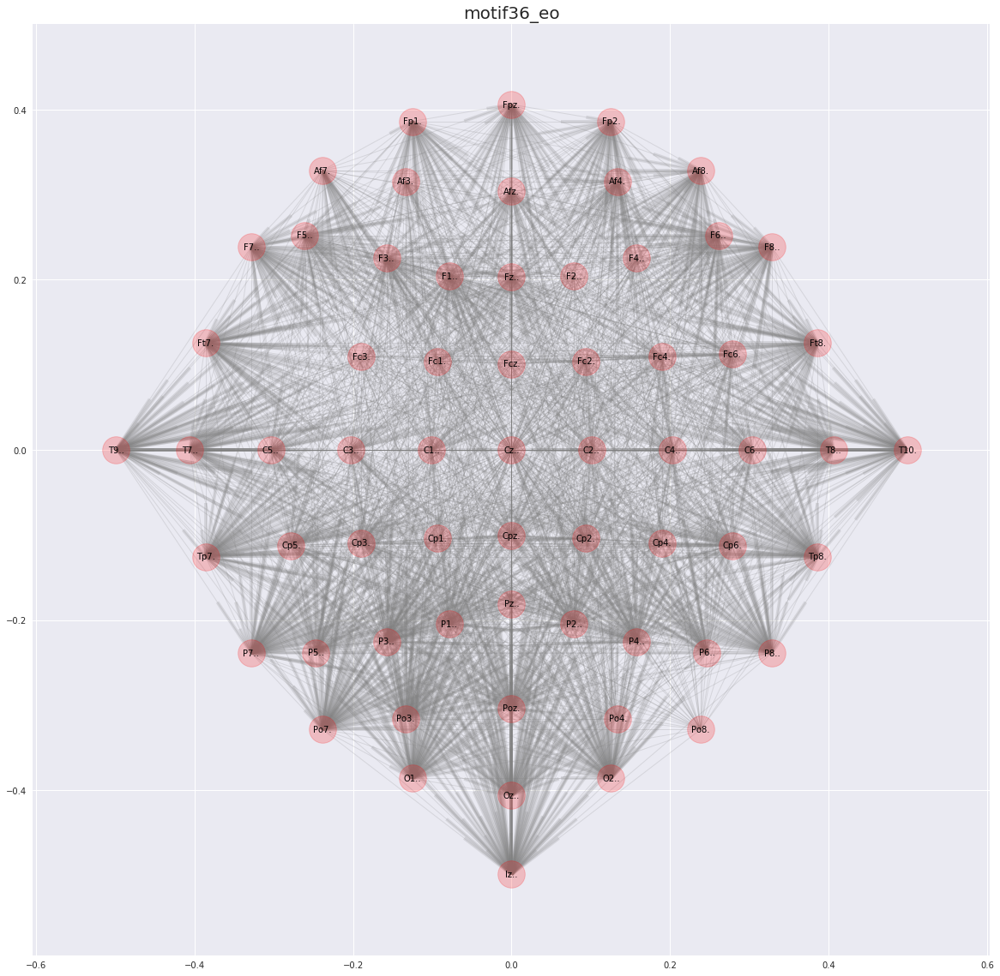

In [345]:
plt.figure(figsize=(20,20))
nx.draw_networkx(g_motifs36_eo, pos=position36_eo, arrows=True,
                 edge_color="gray", node_size=1000, node_shape="o", font_size=10,
                linewidths=1, width=1, cmap=plt.cm.autumn_r, alpha=0.2)
#nx.draw_networkx_edge_labels(g_motifs36_eo, position36_eo, edge_labels=edge_labels36_eo)
plt.grid()
plt.title("motif36_eo", fontsize=20)
plt.savefig("motif36_eo", format="pdf")
plt.show()

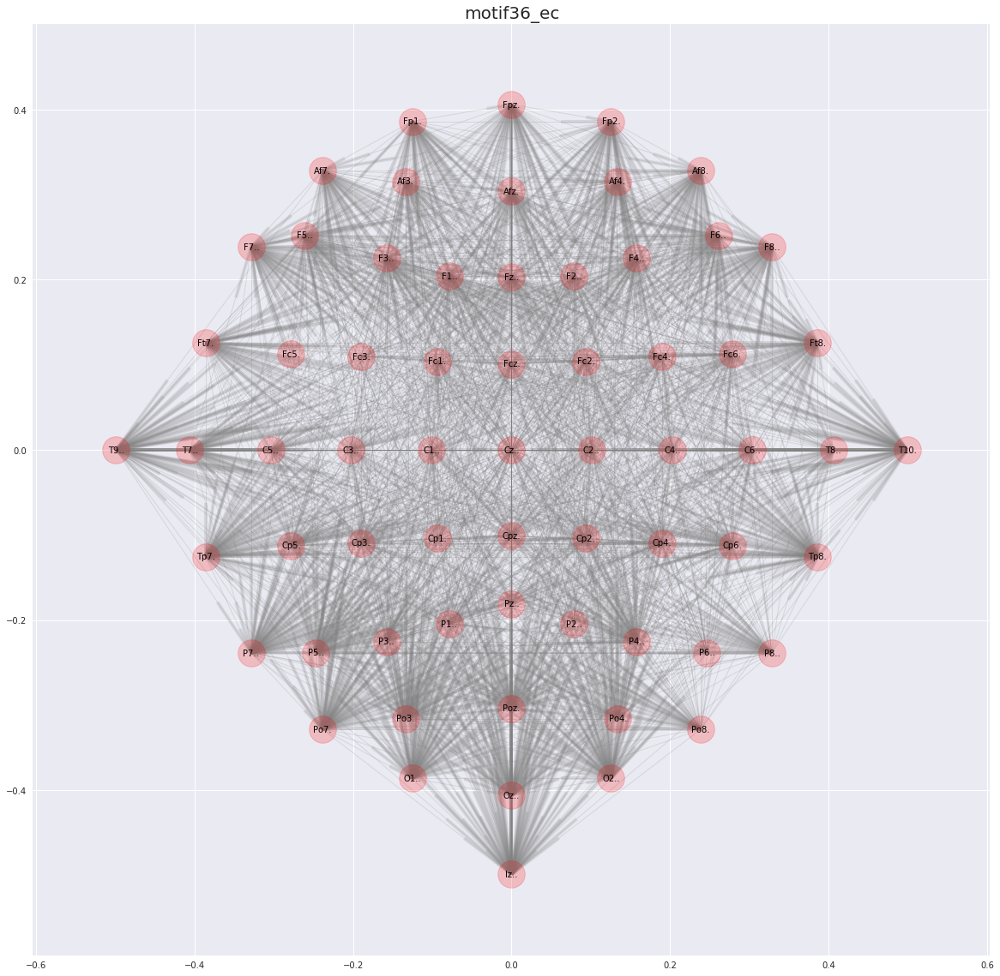

In [346]:
plt.figure(figsize=(20,20))
nx.draw_networkx(g_motifs36_ec, pos=position36_ec, arrows=True,
                 edge_color="gray", node_size=1000, node_shape="o", font_size=10,
                linewidths=1, width=1, cmap=plt.cm.autumn_r, alpha=0.2)
#nx.draw_networkx_edge_labels(g_motifs36_eo, position36_eo, edge_labels=edge_labels36_eo)
plt.grid()
plt.title("motif36_ec", fontsize=20)
plt.savefig("motif36_ec", format="pdf")
plt.show()

### 4.4) Perform the same analysis described in task 4.1 considering 4-node motifs

In [ ]:
! mfinder motif_input_eo.txt -r 10 -s 4 -omat

In [ ]:
! mfinder motif_input_ec.txt -r 10 -s 4 -omat

In [ ]:
motifs4_eo = np.loadtxt("./motifs/motif4/eo/motif_input_eo_MAT.txt")
motifs4_ec = np.loadtxt("./motifs/motif4/ec/motif_input_ec_MAT.txt")

In [ ]:
indices4_eo=motifs_analysis(motifs4_eo)
indices4_ec=motifs_analysis(motifs4_ec)

In [ ]:
motif4_eo_df = pd.DataFrame(indices4_eo, index=indices4_eo["ix"], columns=["frequency", "statistical significance"])
motif4_ec_df = pd.DataFrame(indices4_ec, index=indices4_ec["ix"], columns=["frequency", "statistical significance"])

In [ ]:
motif4_eo_df.to_csv("motif4_eo.csv")
motif4_ec_df.to_csv("motif4_ec.csv")

# community detection

### 5.1) Determine number and composition (i.e. list of nodes) of the communities obtained applying one of the algorithms introduced​ during the course.

In [295]:
Z_community_eo = thresholding(Z_dtf_eo, 0.2)
Z_community_ec = thresholding(Z_dtf_ec, 0.2)

In [296]:
G_community_eo = nx.DiGraph(Z_community_eo)
G_community_ec = nx.DiGraph(Z_community_ec)

In [297]:
def build_community_graph(Z_dtf_community):
    conn_indices = np.where(Z_dtf_community)
    weights = Z_dtf_community[conn_indices]
    edges = list(zip(*conn_indices))
    # initialize the graph from the edge sequence
    g_community = igraph.Graph(edges=edges, directed=True)
    g_community.vs['label'] = signal_labels
    g_community.es['weight'] = weights
    g_community.es['width'] = weights
    return g_community

In [298]:
g_community_eo = build_community_graph(Z_community_eo)
g_community_ec = build_community_graph(Z_community_ec)

### louvain

In [299]:
louvain_clusters_eo=louvain.find_partition(g_community_eo, louvain.ModularityVertexPartition)
louvain_clusters_ec=louvain.find_partition(g_community_ec, louvain.ModularityVertexPartition)

In [300]:
len(louvain_clusters_eo)

6

In [301]:
len(louvain_clusters_ec)

5

In [302]:
def process_louvain(louvain_clusters):
    louvain = {"ix":[], "cluster": []}
    for cluster in range(len(louvain_clusters)):
        for c in louvain_clusters[cluster]:
            louvain["ix"].append(c)
            louvain["cluster"].append(cluster)
    louvain_df = pd.DataFrame(louvain)
    return louvain_df

In [303]:
louvain_eo = process_louvain(louvain_clusters_eo)
louvain_ec = process_louvain(louvain_clusters_ec)

In [ ]:
louvain_eo.to_csv("louvain_eo.csv")
louvain_ec.to_csv("louvain_ec.csv")

### 5.2) Make a graphical representation of the community structure in both rest conditions

In [304]:
def generate_cluster_colors(G, louvain_clusters):
    clusters={}
    for cluster in range(len(louvain_clusters)):
        for c in louvain_clusters[cluster]:
            clusters[c] = cluster
    colors=[clusters[i] for i in G.nodes()]
    return  colors

In [305]:
colors_eo=generate_cluster_colors(G_community_eo, louvain_clusters_eo)
colors_ec=generate_cluster_colors(G_community_ec, louvain_clusters_ec)

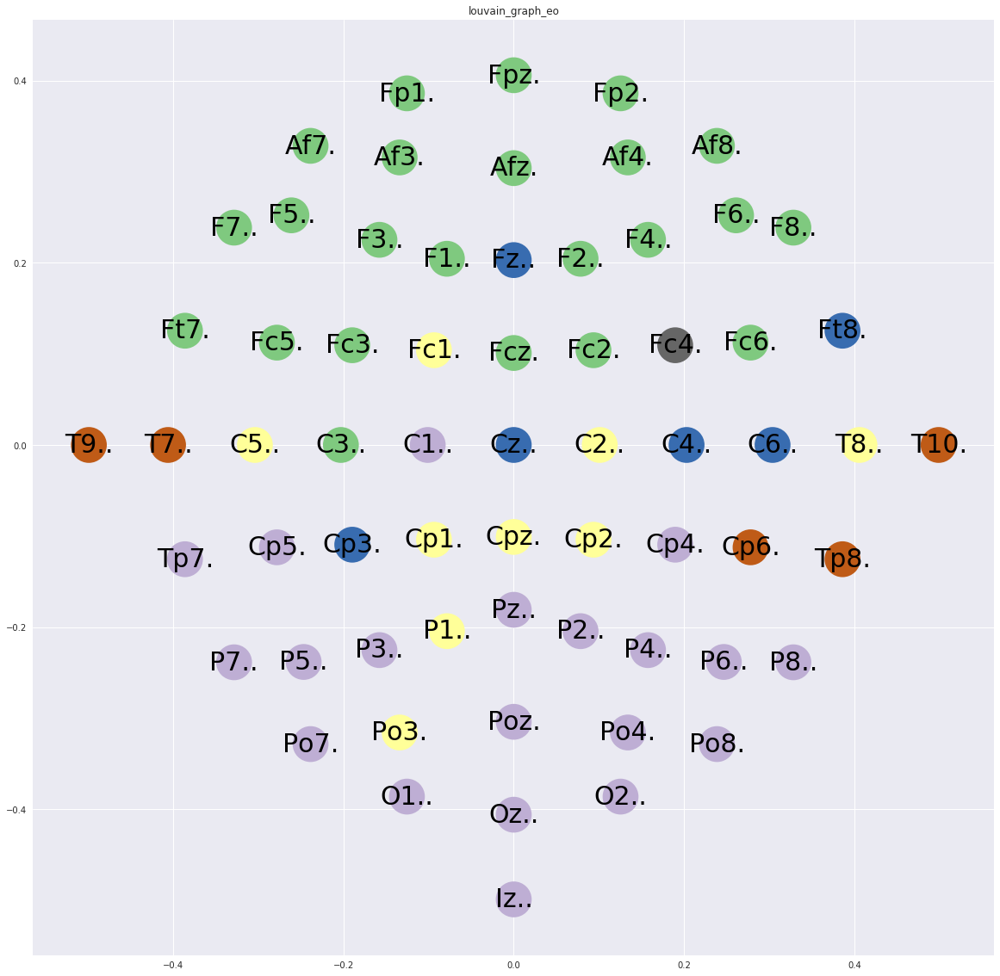

In [306]:
plt.figure(figsize=(20,20))
nx.draw_networkx(G_community_eo, pos=position, arrows=True, labels={k:v for k,v in enumerate(signal_labels)},
                 edge_color="green", node_color=colors_eo, node_size=1000, node_shape="o", font_size=30,
                linewidths =10, width=2, edgelist=[ ], cmap=plt.cm.Accent)
plt.grid()
plt.title("louvain_graph_eo")
plt.savefig("louvain_graph_eo", format="pdf")
plt.show()

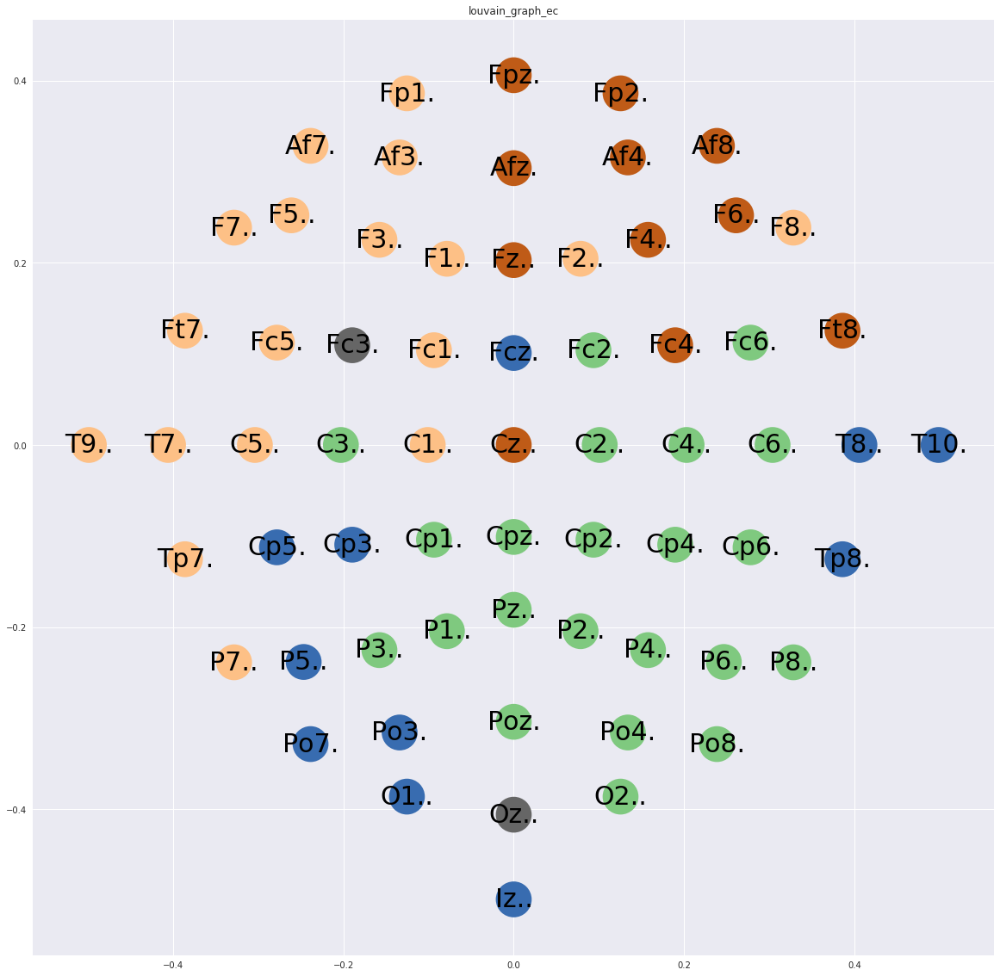

In [307]:
plt.figure(figsize=(20,20))
nx.draw_networkx(G_community_ec, pos=position, arrows=True, labels={k:v for k,v in enumerate(signal_labels)},
                 edge_color="green", node_color=colors_ec, node_size=1000, node_shape="o", font_size=30,
                linewidths =10, width=2, edgelist=[ ], cmap=plt.cm.Accent)
plt.grid()
plt.title("louvain_graph_ec")
plt.savefig("louvain_graph_ec", format="pdf")
plt.show()

### 5.3) Compare the community structure obtained by means of two different methods (modularity-based vs information theory-based approaches).

### Infomap

In [310]:
def generate_infomap_file(G_community, name):
    g_community_list=G_community.edges()
    community_list = []

    for row in g_community_list:
        community_list.append([row[0], row[1], G_community[row[0]][row[1]]["weight"]])
    community_df=pd.DataFrame(community_list)
    community_df.to_csv(name, sep="\t", index=False, header=False)

In [ ]:
generate_infomap_file(G_community_eo, "infomap_eo.txt")
generate_infomap_file(G_community_ec, "infomap_ec.txt")

In [ ]:
#! Infomap -d -z -2 community_infomap.txt ./infomap/

In [311]:
infomap_eo=pd.read_csv("./community_detection/infomap/eo/infomap_eo.tree", sep=" ", header=None, index_col=False)
infomap_ec=pd.read_csv("./community_detection/infomap/ec/infomap_ec.tree", sep=" ", header=None, index_col=False)

In [312]:
def process_infomap(infomap):
    infomap_clusters=infomap[0].values
    infomap_clusters = [int(i.split(":")[0]) for i in infomap_clusters]
    nodes_clusters = list(infomap[2].values)
    clusters_infomap=list(zip(infomap_clusters, nodes_clusters))
    return clusters_infomap

In [313]:
clusters_infomap_eo = process_infomap(infomap_eo)
clusters_infomap_ec = process_infomap(infomap_ec)

In [314]:
clusters_infomap_eo_df = {"cluster": [i[0] for i in clusters_infomap_eo], "ix": [i[1] for i in clusters_infomap_eo]}
clusters_infomap_ec_df = {"cluster": [i[0] for i in clusters_infomap_ec], "ix": [i[1] for i in clusters_infomap_ec]}

In [315]:
clusters_infomap_eo_df=pd.DataFrame(clusters_infomap_eo_df)
clusters_infomap_ec_df=pd.DataFrame(clusters_infomap_ec_df)

In [316]:
clusters_infomap_eo_df.to_csv("infomap_eo.csv", index=None)
clusters_infomap_ec_df.to_csv("infomap_ec.csv", index=None)

In [317]:
def colors_infomap(clusters_infomap):
    clusters= {}
    for row in clusters_infomap:
        clusters[row[1]] = row[0]
    colors=[clusters[i]-1 for i in range(len(clusters))]
    return colors

In [318]:
colors_infomap_eo = colors_infomap(clusters_infomap_eo)
colors_infomap_ec = colors_infomap(clusters_infomap_ec)

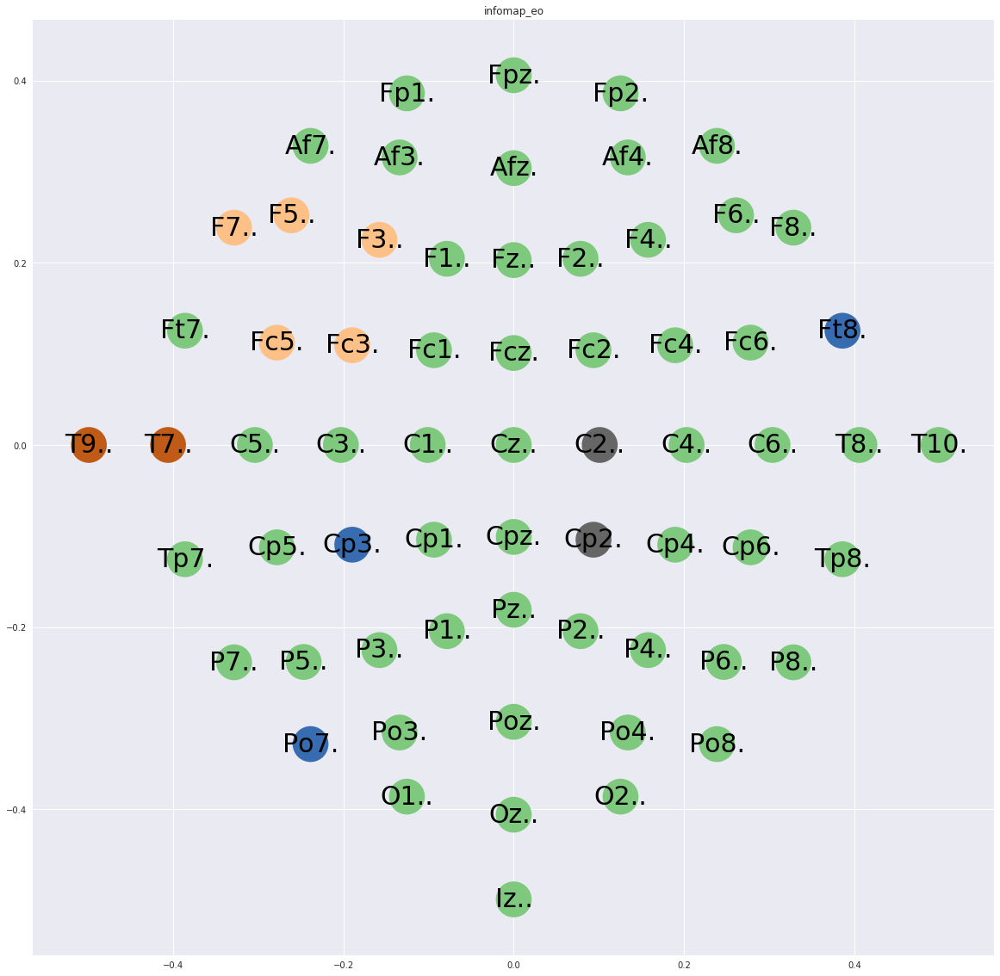

In [319]:
plt.figure(figsize=(20,20))
nx.draw_networkx(G_community_eo, pos=position, arrows=True, labels={k:v for k,v in enumerate(signal_labels)},
                 edge_color="green", node_color=colors_infomap_eo, node_size=1000, node_shape="o", font_size=30,
                linewidths =10, width=2, edgelist=[ ], cmap=plt.cm.Accent)
plt.grid()
plt.title("infomap_eo")
plt.savefig("infomap_eo", format="pdf")
plt.show()

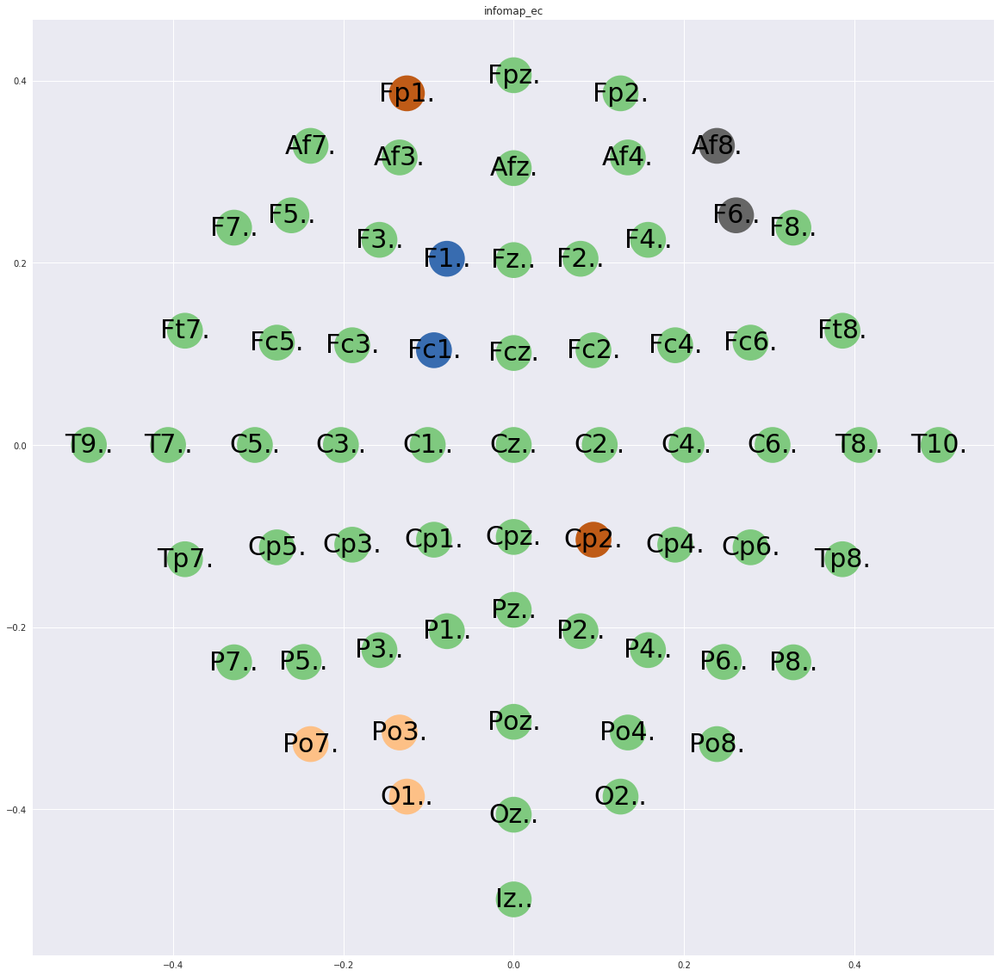

In [322]:
plt.figure(figsize=(20,20))
nx.draw_networkx(G_community_ec, pos=position, arrows=True, labels={k:v for k,v in enumerate(signal_labels)},
                 edge_color="green", node_color=colors_infomap_ec, node_size=1000, node_shape="o", font_size=30,
                linewidths =10, width=2, edgelist=[ ], cmap=plt.cm.Accent)
plt.grid()
plt.title("infomap_ec")
plt.savefig("infomap_ec", format="pdf")
plt.show()